In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.collections import PatchCollection
import numpy as np
import missingno as msno
from scipy import stats
import sys
sys.path.insert(1, '../Scripts')
from funciones import simbologia, graficar_versus_core

During the interviews conducted with the tephrochronology community in Chile, one repeated need was being able to assess if the geochemical measurements where comparable or no. 

At present, this question is answered by geochemists by the measurement of internal standards which allows to understand how comparable are the measurments among laboratories. These internal standars correspond to specific material (rocks) for which their chemical composition is "known" and ideally "certified" (Jochum et al., 2006), which are analyzed at the same time as the studied samples. The samples and standards are analyzed in batches which are inicated in the data base under the attribute "MeasurementRun". 

Two kind of metrics are more rutinely calculated:

-	Accuracy. Refers to how close to the “actual” value is the measured value. For this, the average value of the analyzes of the standards and its standard deviation and compare it with the “known” value of the standard. Values closer to one are more accurate. 

-	Precision. Refers to the dispersion of the analyzed values. For understanding this value, in general the relative standard deviation is calculated (1sd/average). The latter is done because it allows to compare the standard deviations of the different analyzed elements.

Ideally we will interpret the chemical composition of the elements that are more accurately measured and with a smaller relative standard deviation (RSD).


In [130]:
#Load the data and filter 
Data = pd.read_excel("../Data/TephraDataBase.xlsx")
Data = Data.dropna(subset = ['MeasurementRun'])
Data.loc[:,'MeasurementRun'] = Data.loc[:,'MeasurementRun'].astype('str')
Data = Data.reset_index(drop=True)

In [131]:
#Load data of standards measured in each run. According with the available information in the literature, the information 
# recolected was the MeasurementRun when the standard was analyzed, the name of the standard (e.g. ATHO-G, ML3B-G),
# the average measured value, its standard deviation(SD), the relative standard deviation (RSD)
# and the number of measurement of each standard (n).
Data_standards = pd.read_excel('../Data/TephraDataBase_Standards.xlsx')
Data_standards.loc[:,'MeasurementRun'] = Data_standards.loc[:,'MeasurementRun'].astype('str')

#There is still some incomplete infomation, filtered below
Data_standards = Data_standards[(Data_standards.Reference != 'Rawson et al., 2015')&(Data_standards.Reference != 'Hickey-Vargas et al., 1989')]

#Check which runs in the database don't have a mirror in the DataBase_Standards file
temp = []
for run in Data.MeasurementRun.unique():
    if(run in Data_standards.MeasurementRun.values)== False:
        print(run,type(run))
        temp.append(run)
        
print(temp)

DelCarlo2018EMP, DelCarlo2018LAICPMS <class 'str'>
23-11-2009 <class 'str'>
26-11-2009 <class 'str'>
25-11-2009 <class 'str'>
20-10-2010 <class 'str'>
27-11-2009 <class 'str'>
Rawson2015 <class 'str'>
['DelCarlo2018EMP, DelCarlo2018LAICPMS', '23-11-2009', '26-11-2009', '25-11-2009', '20-10-2010', '27-11-2009', 'Rawson2015']


In [132]:
#Drop data points with no mirror in DataBase_standards  
Data = Data[~Data.MeasurementRun.isin(temp)].copy()
Data = Data.reset_index(drop=True)

In [133]:
#Load Standard reference values and filter the ones with '95%CL' which correspond to the standars with a certified value
# by Jochum et al., 2006!
# !!!! These values appear in this web site: http://georem.mpch-mainz.gwdg.de/
# I don't know if it would be better to automatise a way of downloading them?

Standards_ref = pd.read_excel('../Data/Standards_Reference.xlsx')
Standards_ref = Standards_ref[Standards_ref.σ == '95%CL'].copy()
Standards_ref = Standards_ref.reset_index(drop=True)

In [134]:
# Obtaining Accuracy: Measured Average/ Certified Value for each analyzed element
MeasuredVsRef = pd.DataFrame(0, index = np.arange(len(Data_standards.Standard)) ,columns = ['MeasurementRun','Standard','SiO2','TiO2','Al2O3','MnO','MgO','FeO*','CaO','Na2O','K2O','P2O5','Rb','Sr','Y','Zr','Nb','Cs','Ba','La','Ce','Pr','Nd','Sm','Eu','Gd','Tb','Dy','Ho','Er','Tm','Yb','Lu','Hf','Ta','Pb','Th','U'])
elementos = ['SiO2','TiO2','Al2O3','MnO','MgO','FeO*','CaO','Na2O','K2O','P2O5','Rb','Sr','Y','Zr','Nb','Cs','Ba','La','Ce','Pr','Nd','Sm','Eu','Gd','Tb','Dy','Ho','Er','Tm','Yb','Lu','Hf','Ta','Pb','Th','U']
Data_standards = Data_standards.replace(np.nan,-1) 
Data_standards = Data_standards.replace('<0.01',-1) 
Data_standards = Data_standards.replace('<0.002',-1)
Data_standards = Data_standards.replace('Over range',-1)
Data_standards = Data_standards.replace('<5',-1)
Data_standards = Data_standards.replace('> 10000',-1)
Data_standards = Data_standards[Data_standards.Standard.isin(Standards_ref[Standards_ref.σ == "95%CL"].Standard.unique().tolist())].copy()

for elemento in elementos:
    MeasuredVsRef[elemento] = MeasuredVsRef[elemento].astype('float64')
    
i=0
for run in Data_standards.MeasurementRun.unique():
    temp = Data_standards[Data_standards.MeasurementRun==run]
    for std in temp.Standard.unique():
        MeasuredVsRef.MeasurementRun[i] = run
        MeasuredVsRef.Standard[i] = std
        
        temp1 = temp[temp.Standard == std]
        index1 = temp1.first_valid_index()
        
        temp2 = Standards_ref[Standards_ref.Standard == std]
        index2 = temp2.first_valid_index()
        
        for elemento in elementos:
            if (temp1[elemento][index1] != -1) & (temp2[elemento][index2] != -1):
                #print(type(temp1[elemento][index1]))
                #print(type(temp2[elemento][index2]))                
                MeasuredVsRef[elemento][i] = temp1[elemento][index1]/temp2[elemento][index2]
                #print(type(Standards_Color[elemento][i]))
                #print(temp1[elemento][index1]/temp2[elemento][index2])
        i=i+1            
                
MeasuredVsRef = MeasuredVsRef.replace(-1,np.nan)
MeasuredVsRef = MeasuredVsRef.replace(0,np.nan)
MeasuredVsRef = MeasuredVsRef.dropna(subset = ['MeasurementRun'],axis=0)
MeasuredVsRef.loc[:,'MeasurementRun'] = MeasuredVsRef.loc[:,'MeasurementRun'].astype('str')
MeasuredVsRef

C:\Users\consu\anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\consu\anaconda3\lib\site-packages\ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\consu\anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
C:\Users\consu\anaconda3\lib\site-packages\ipykernel

,MeasurementRun,Standard,SiO2,TiO2,Al2O3,MnO,MgO,FeO*,CaO,Na2O,...,Ho,Er,Tm,Yb,Lu,Hf,Ta,Pb,Th,U
0,100415,ATHO-G,0.990875,1.002941,1.000318,1.042558,0.821359,0.994764,0.980520,1.135433,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100415,StHs6/80-G,0.990283,1.020792,0.987186,0.954020,1.007941,1.017840,1.006485,1.027100,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100415,ML3B-G,1.001149,1.017492,1.006888,0.942561,1.022092,1.022774,0.999968,0.976382,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,220115,ATHO-G,0.988951,0.959529,0.998515,1.081792,0.944660,1.005190,0.989406,1.151584,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,220115,ML3B-G,0.997689,1.001714,0.999097,1.060059,1.013812,1.005463,0.999070,1.003717,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172,270918,GOR132-G,1.007552,0.958715,0.899813,1.015801,1.149921,0.953034,0.730982,0.676723,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
173,270918,KL2-G,0.993822,1.008375,1.011573,1.018828,0.987427,0.997862,0.996484,0.963191,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
174,290918,StHs6/80-G,0.991848,1.000553,0.996445,0.846272,0.988119,0.989094,0.981117,1.056839,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
175,290918,GOR132-G,1.012717,0.873729,0.905594,1.008947,1.147521,0.948430,0.721510,0.681178,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [115]:
MeasuredVsRef.to_excel('../Data/MeasuredVsRef.xlsx')

In [62]:
MeasuredVsRef = pd.read_excel("../Data/MeasuredVsRef.xlsx")

In [135]:
def simbología_std(std):
    simbología = pd.read_excel('../Data/Standards_Reference.xlsx')
    temp = simbología.loc[simbología['Standard'] == std]
    coloR = temp.values[0,1]
    return coloR

In [121]:
# Plot the accuracy for all the elements analyzed for each Standards in each MeasurementRun
#grafico
def graficar_Acc(Accuracy_data):

    # Here we choose which set of elements we want to analyze
    elementos = ['SiO2','TiO2','Al2O3','MnO','MgO','FeO*','CaO','Na2O','K2O','P2O5','Rb','Sr','Y','Zr','Nb','Cs','Ba','La','Ce','Pr','Nd','Sm','Eu','Gd','Tb','Dy','Ho','Er','Tm', 'Yb', 'Lu', 'Hf', 'Ta', 'Pb', 'Th', 'U']
    #elementos = ['SiO2','TiO2','Al2O3','MnO','MgO','FeO*','CaO','Na2O','K2O','P2O5']
    linea1 = np.empty(36)
    linea1.fill(1.05)
    linea2 = np.empty(36)
    linea2.fill(0.95)

    for run in Accuracy_data.MeasurementRun.unique():
        plt.figure(figsize=(12,5))
        ax = plt.axes()        
        temp = Accuracy_data[Accuracy_data.MeasurementRun==run]
        for std in temp.Standard.unique():
            temp2 = temp[temp.Standard == std]
            temp2 = temp2.reset_index(drop=True)
            index2 = temp2.first_valid_index()
            #print(index2)
            #print(temp2)
            Color = simbología_std(std)
            
            plt.plot(elementos, linea1,color = 'lightgrey')
            plt.plot(elementos, linea2,color = 'lightgrey')
            plt.plot(elementos, temp2.iloc[0,2:38],marker = 'o',color = Color,label = std)
        
        leg=plt.legend(fancybox=True, bbox_to_anchor=(1,1),ncol=1,fontsize=12, title="Analyzed Standards")
        plt.ylim(0.4,1.6)
        ax.set_title('Measurement Run: '+ run ,fontsize=16)
        ax.tick_params(labelsize = 12,direction='in',axis='x',rotation=45)
        plt.ylabel("Measured/Certified", fontsize = 14)
        ax.grid(axis ='y')
    #plt.savefig('../Plots/Standards'+std+'.pdf',dpi = 300,bbox_inches='tight')#,bbox_extra_artists=(leg,)
        plt.show()
    

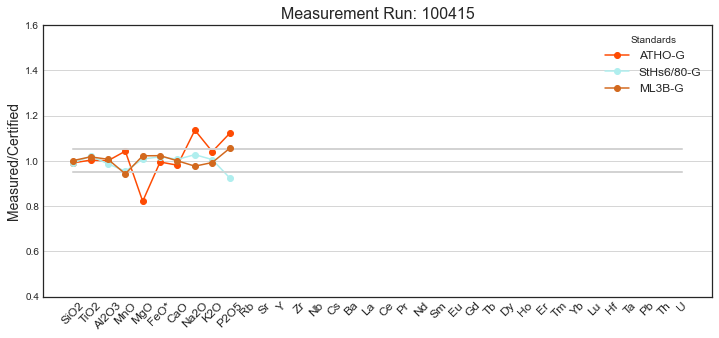

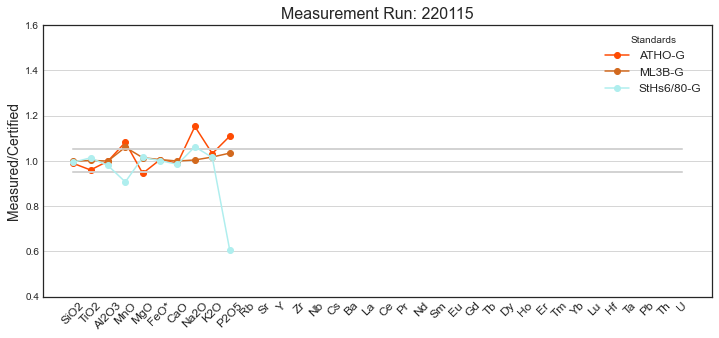

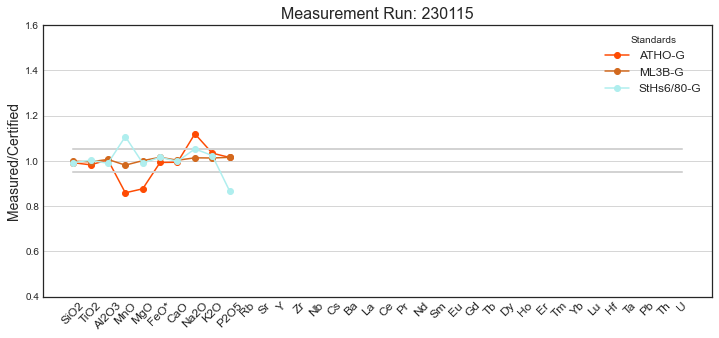

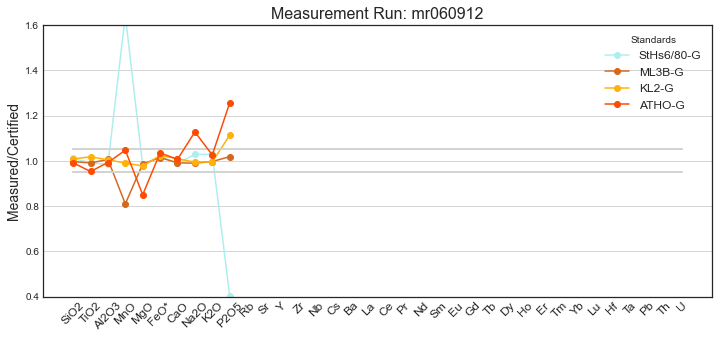

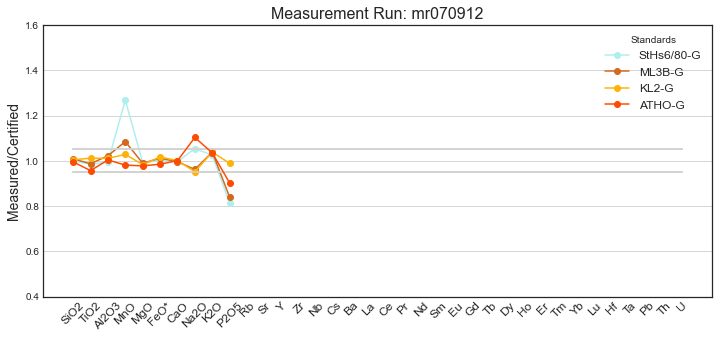

...

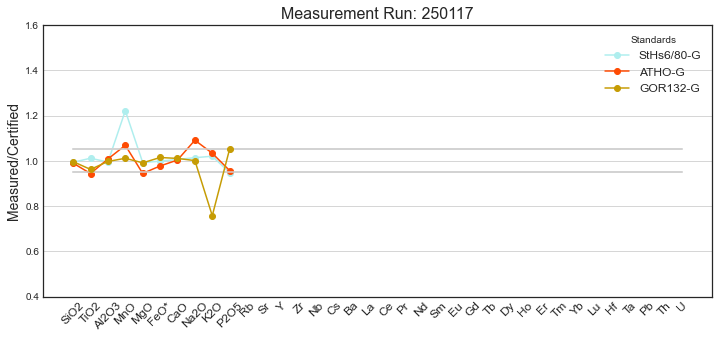

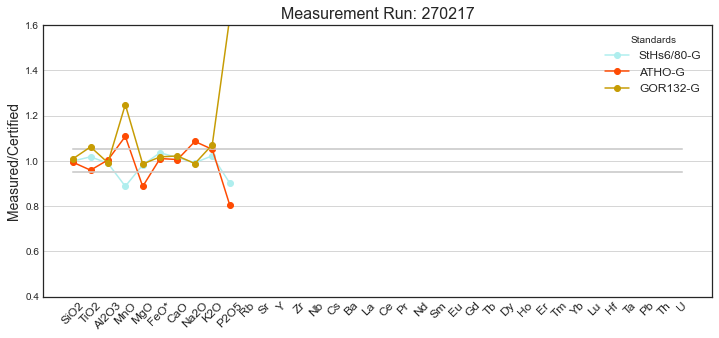

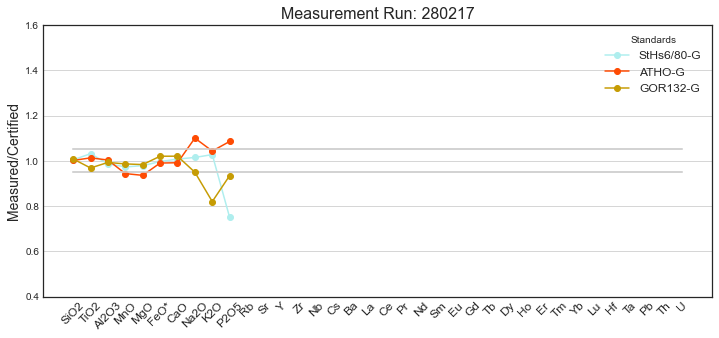

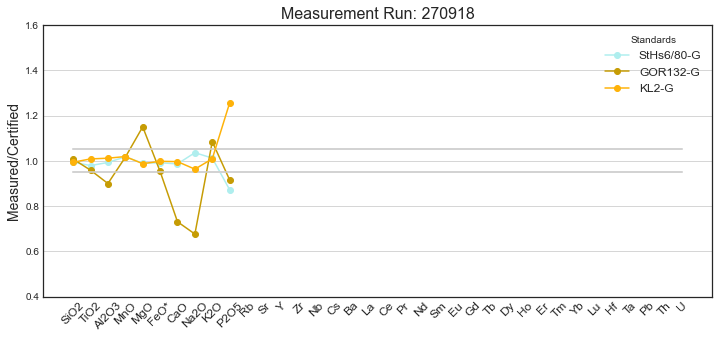

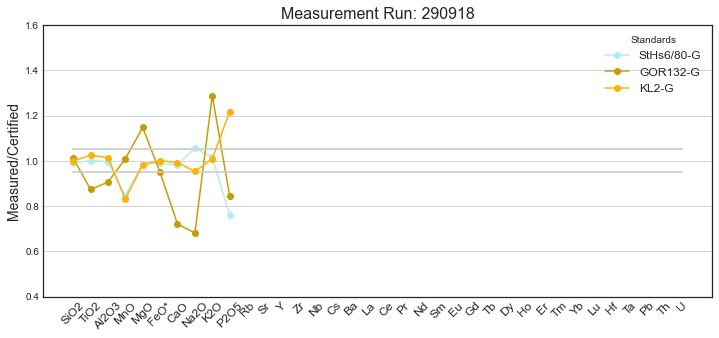

In [120]:
graficar_Acc(MeasuredVsRef)

In [137]:
# Plot
#grafico
def graficar_RSD(TDB_standards):

    elementos = [ 'SiO2', 'TiO2', 'Al2O3', 'FeO*', 'MnO', 'MgO', 'CaO', 'Na2O', 'K2O', 'P2O5', 'Cl', 'Rb', 'Sr', 'Y', 'Zr', 'Nb', 'Cs', 'Ba', 'La', 'Ce', 'Pr', 'Nd', 'Sm', 'Eu', 'Gd','Tb', 'Dy', 'Ho', 'Er', 'Tm', 'Yb', 'Lu', 'Hf', 'Ta', 'Pb', 'Th', 'U']
#    elementos = ['SiO2','TiO2','Al2O3','MnO','MgO','FeO*','CaO','Na2O','K2O','P2O5']
    elementos_RSD = ['RSD_SiO2','RSD_TiO2','RSD_Al2O3','RSD_FeO*','RSD_MnO','RSD_MgO','RSD_CaO','RSD_Na2O','RSD_K2O','RSD_P2O5','RSD_Cl','RSD_Rb','RSD_Sr','RSD_Y','RSD_Zr','RSD_Nb','RSD_Cs','RSD_Ba','RSD_La','RSD_Ce','RSD_Pr','RSD_Nd','RSD_Sm','RSD_Eu','RSD_Gd','RSD_Tb','RSD_Dy','RSD_Ho','RSD_Er','RSD_Tm','RSD_Yb','RSD_Lu','RSD_Hf','RSD_Ta','RSD_Pb','RSD_Th','RSD_U']
    
    linea1 = np.empty(len(elementos))
    linea1.fill(5)
    linea2 = np.empty(len(elementos))
    linea2.fill(10)

    for run in TDB_standards.MeasurementRun.unique():
        plt.figure(figsize=(10,5))
        ax = plt.axes()
        temp = TDB_standards[TDB_standards.MeasurementRun==run]
        for std in temp.Standard.unique():
            temp2 = temp[temp.Standard == std]
            temp2 = temp2.reset_index(drop=True)
            index2 = temp2.first_valid_index()
            Color = simbología_std(std)
            
            plt.plot(elementos, linea1,color = 'lightgrey')
            plt.plot(elementos, linea2,color = 'lightgrey')
            plt.plot(elementos, temp2[elementos_RSD].iloc[0,:],marker = 'o',color = Color,label = std)
        
        leg=plt.legend(fancybox=True, bbox_to_anchor=(1,1),ncol=1,fontsize=12, title="Analyzed Standards")
        plt.ylim(0,50)
        ax.set_title('Measurement Run: '+ run ,fontsize=16)
        ax.tick_params(labelsize = 12,direction='in',axis='x',rotation=45)
        plt.ylabel("Relative SD (%)", fontsize = 14)
        ax.grid(axis ='y')
        
        #plt.savefig('../Plots/Standards'+std+'.pdf',dpi = 300,bbox_inches='tight')#,bbox_extra_artists=(leg,)
        plt.show()
    

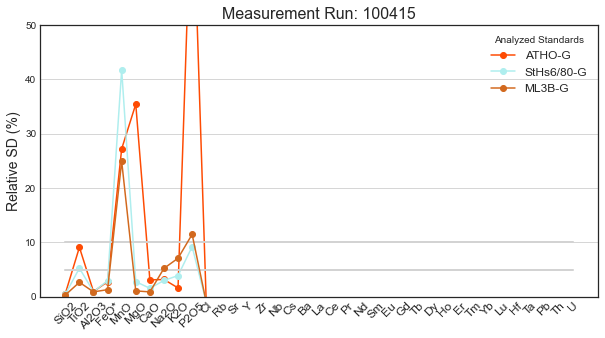

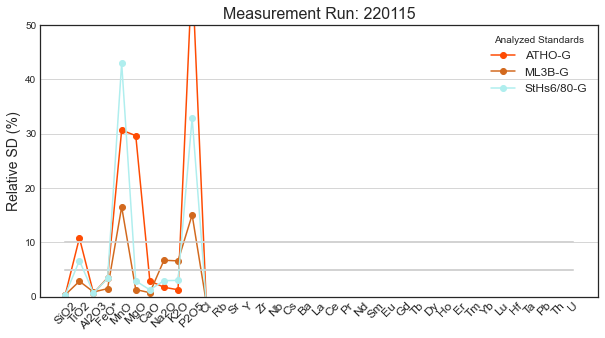

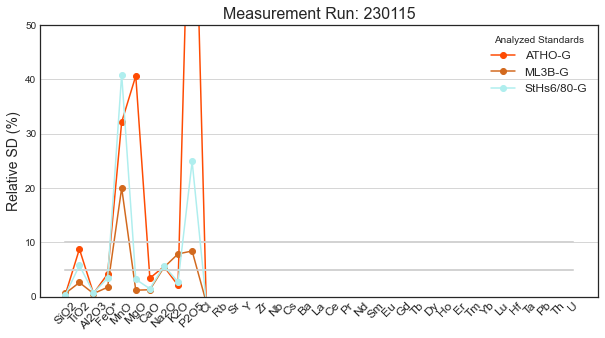

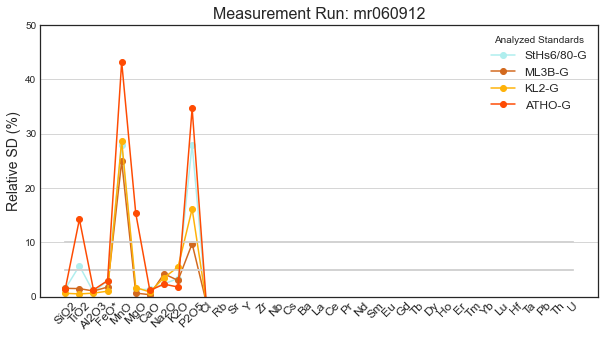

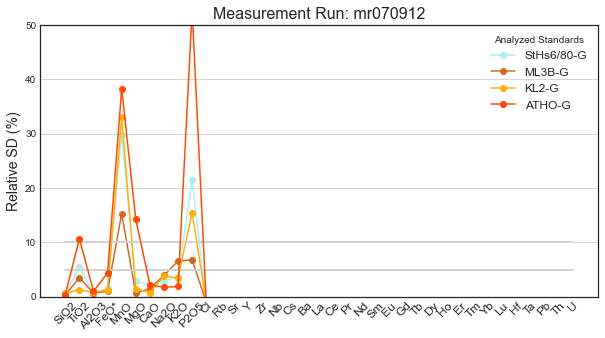

...

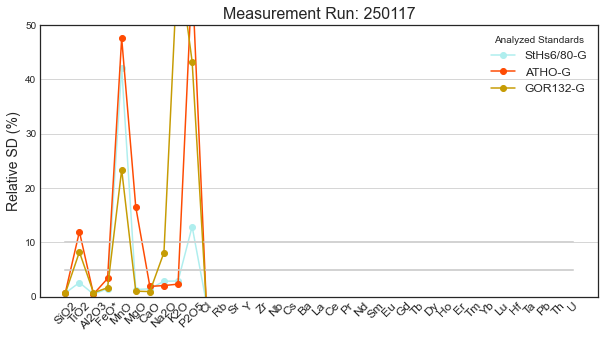

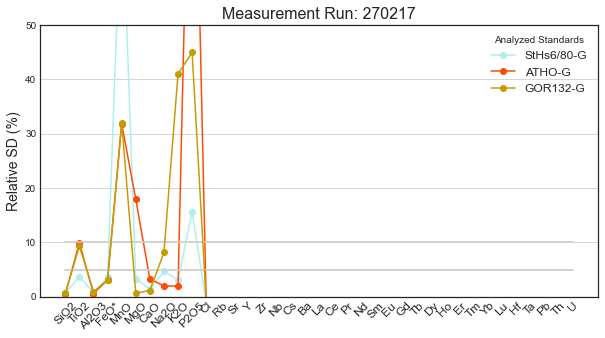

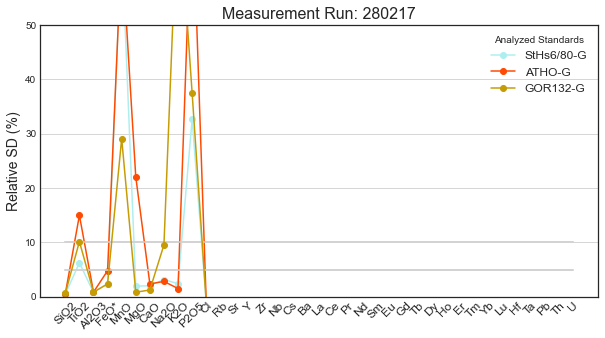

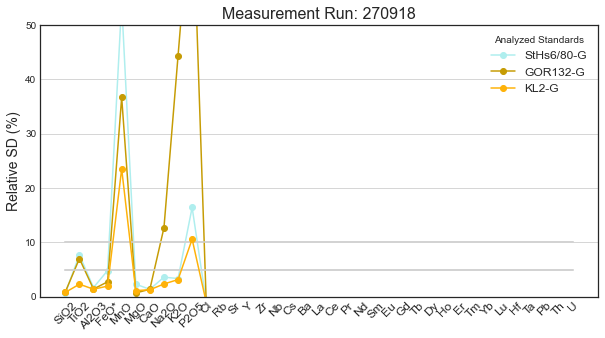

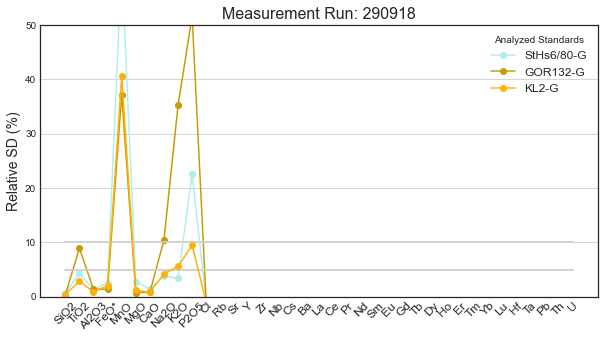

In [138]:
graficar_RSD(Data_standards)

100415


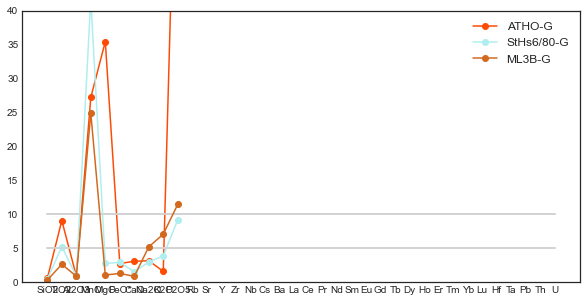

(218, 39)
100415


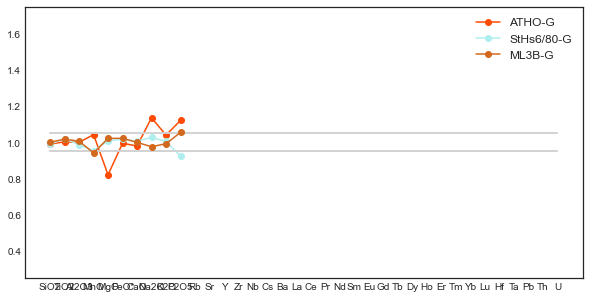

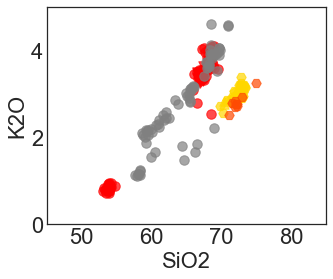

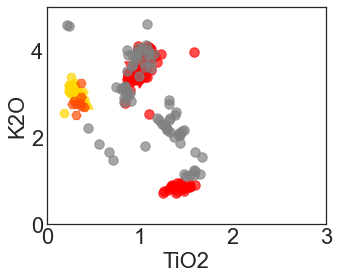

220115


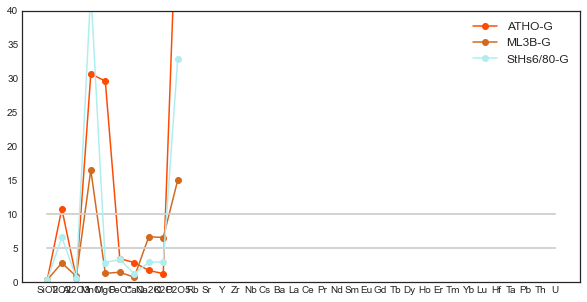

(218, 39)
220115


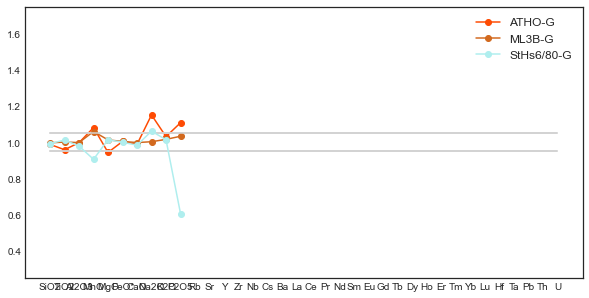

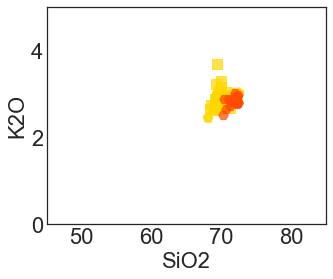

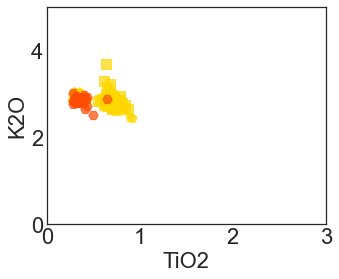

230115


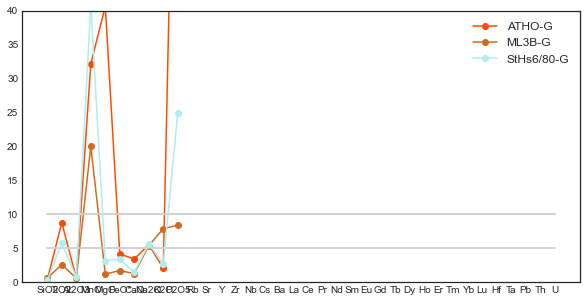

(218, 39)
230115


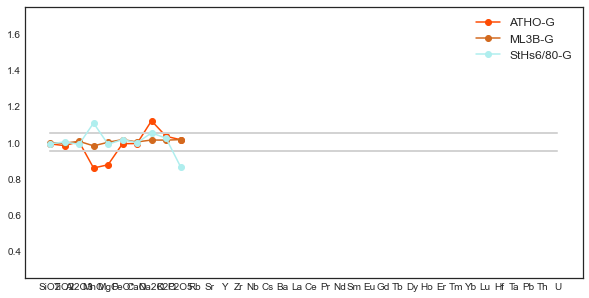

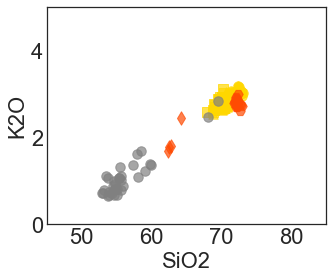

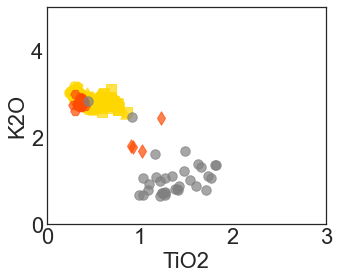

mr060912


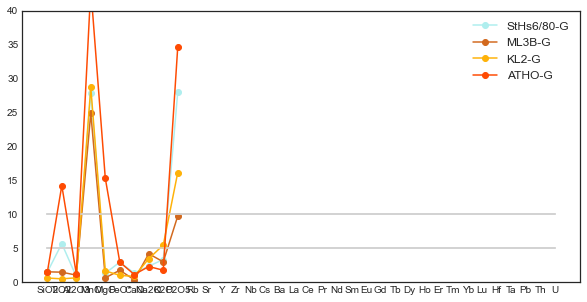

(218, 39)
mr060912


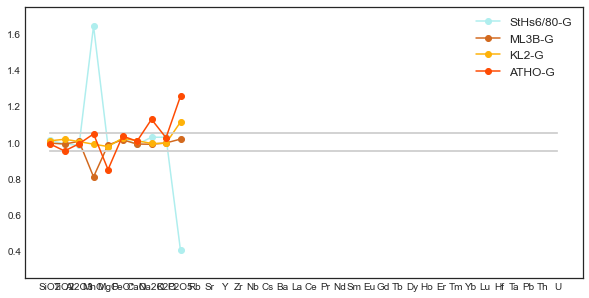

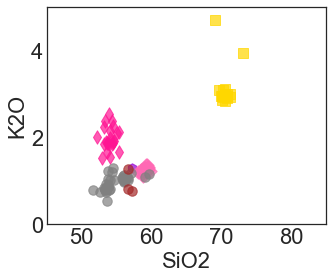

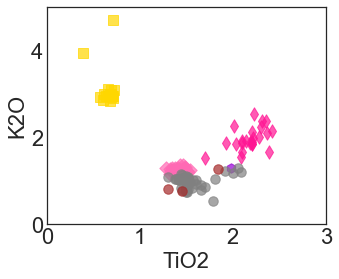

mr070912


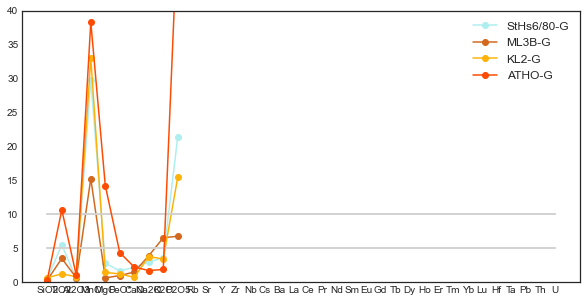

(218, 39)
mr070912


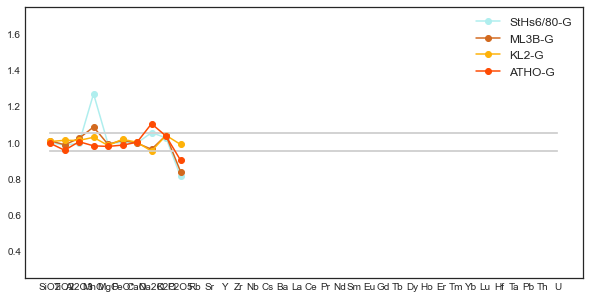

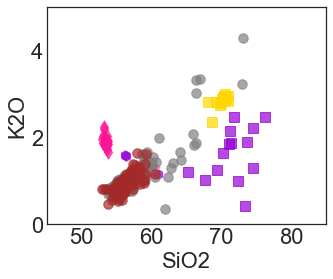

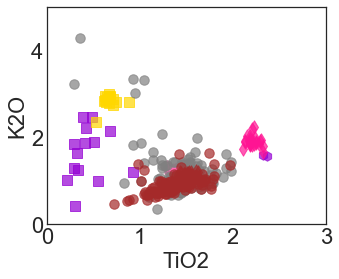

100912


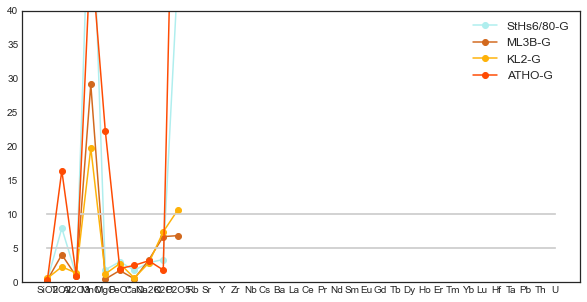

(218, 39)
100912


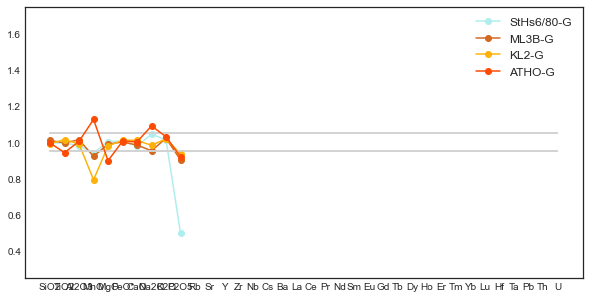

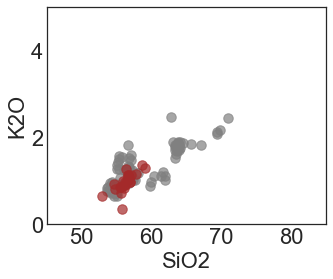

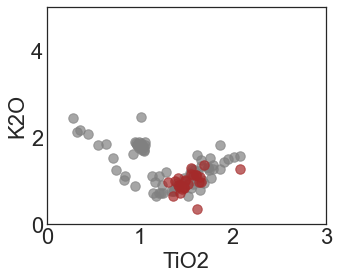

11112


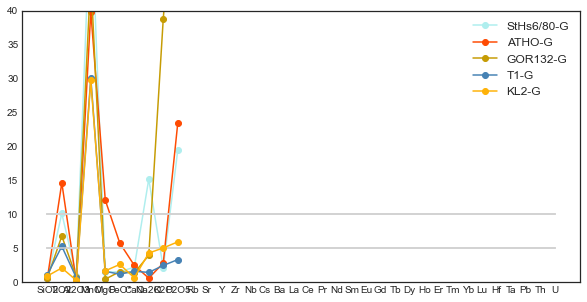

(218, 39)
11112


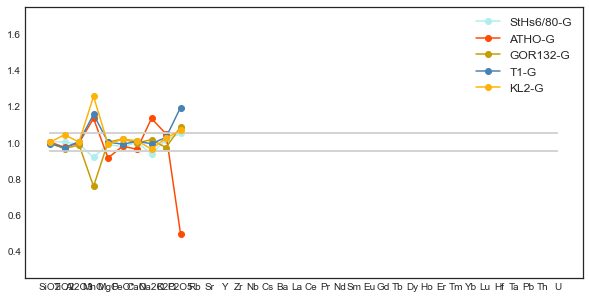

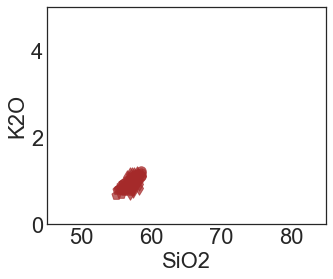

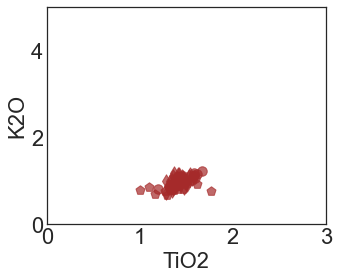

021112


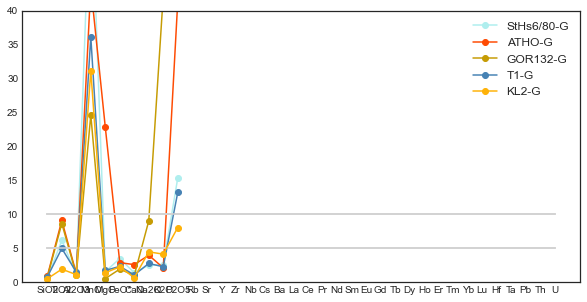

(218, 39)
021112


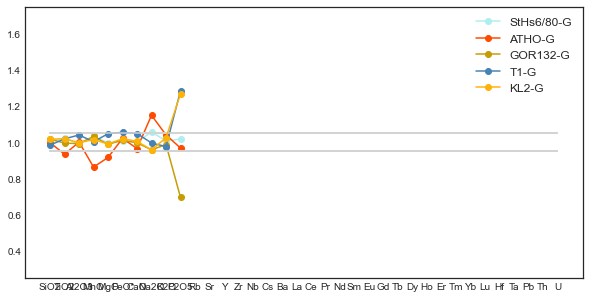

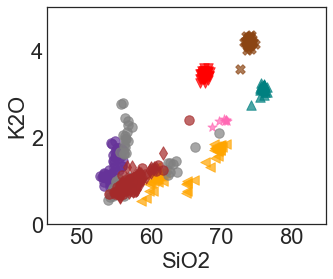

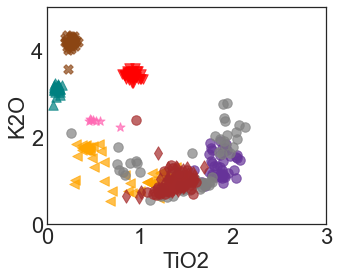

61112


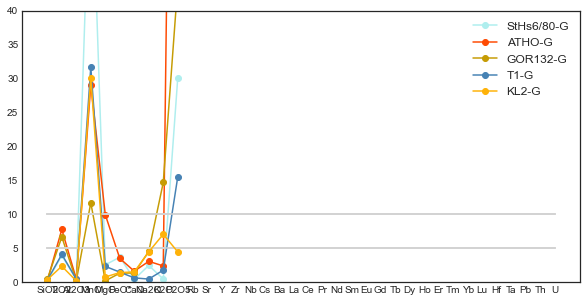

(218, 39)
61112


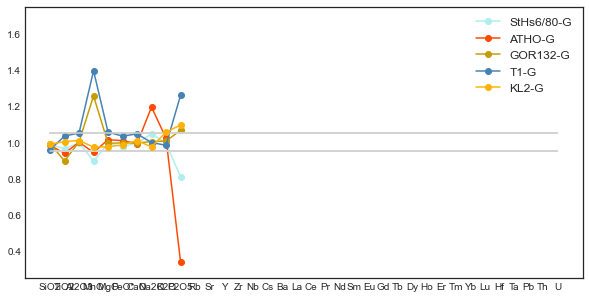

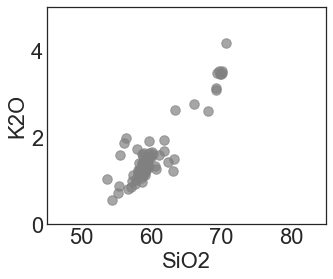

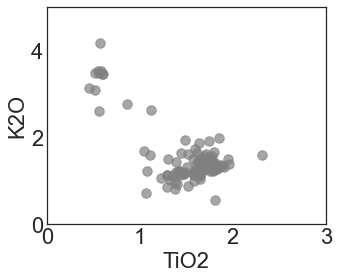

081112


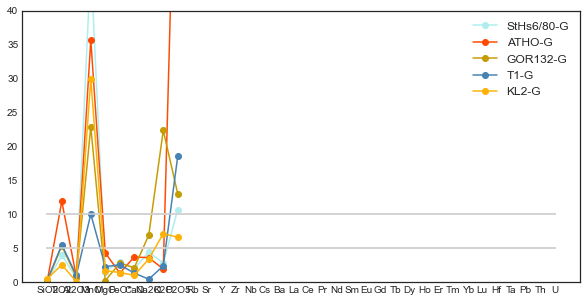

(218, 39)
081112


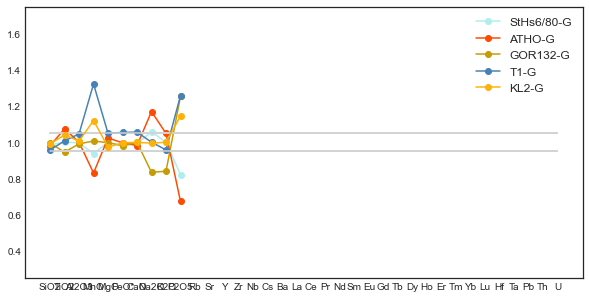

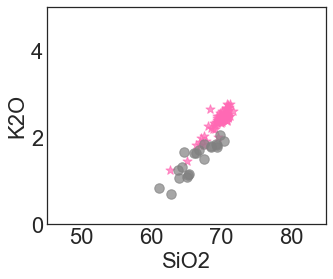

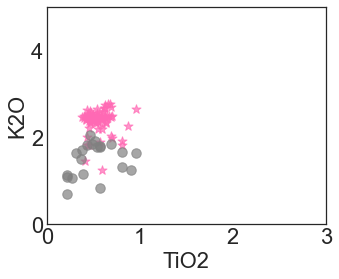

40413


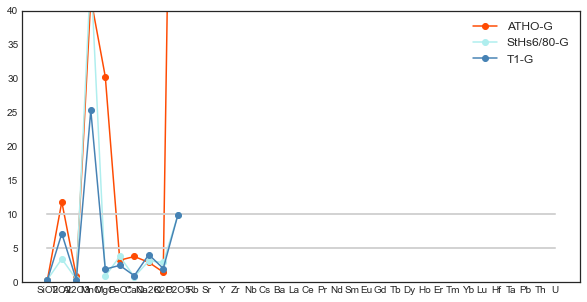

(218, 39)
40413


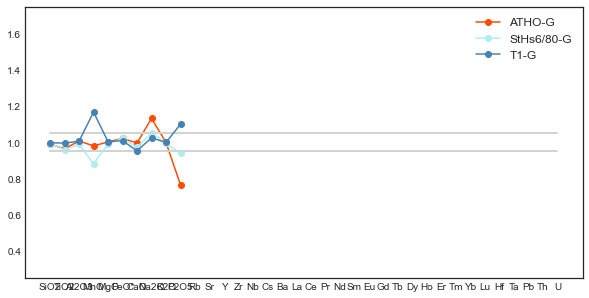

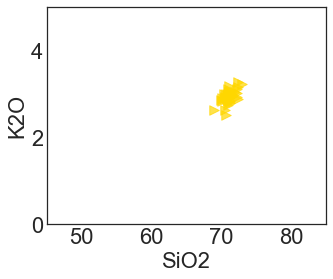

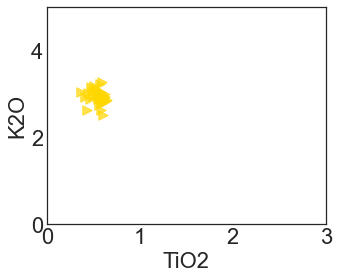

050413


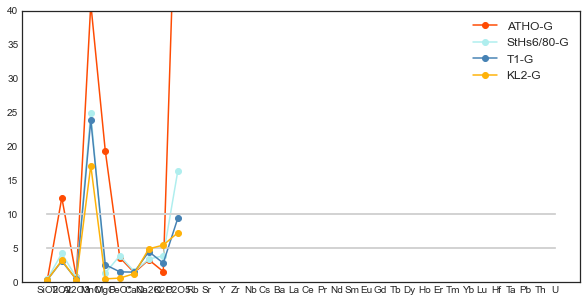

(218, 39)
050413


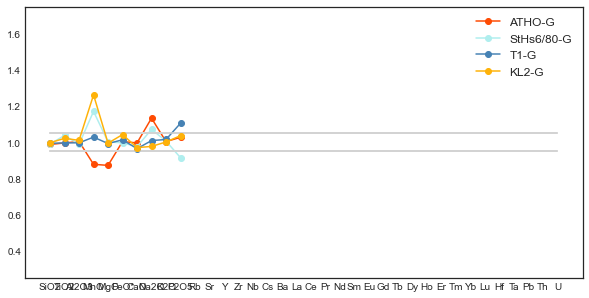

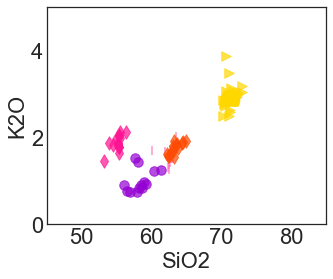

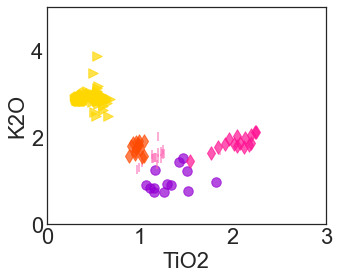

080713


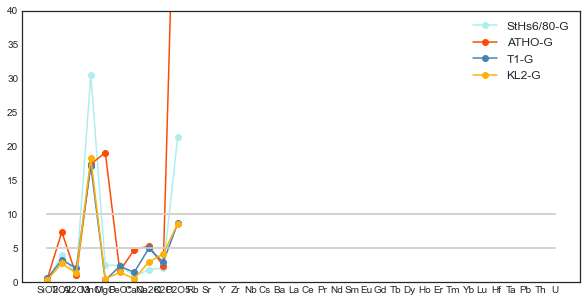

(218, 39)
080713


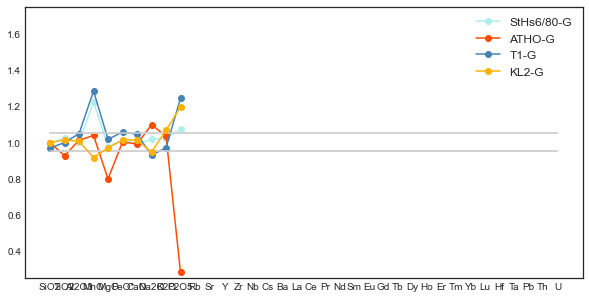

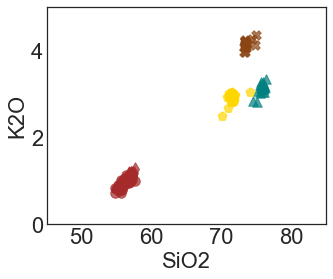

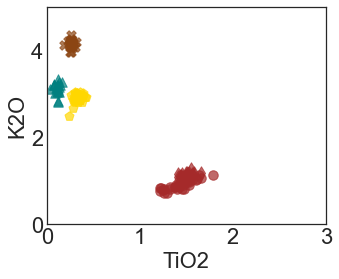

100713


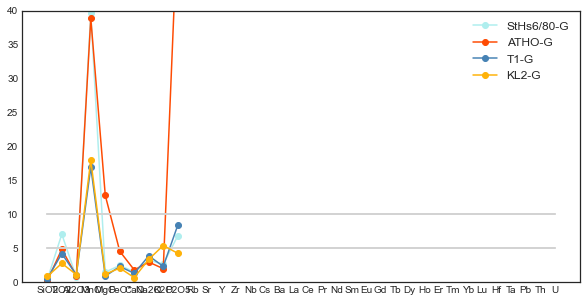

(218, 39)
100713


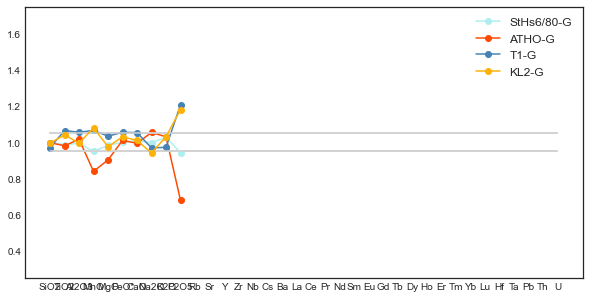

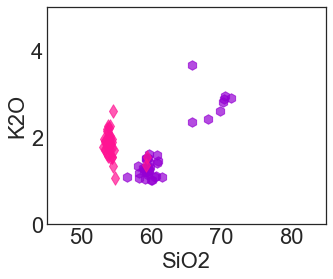

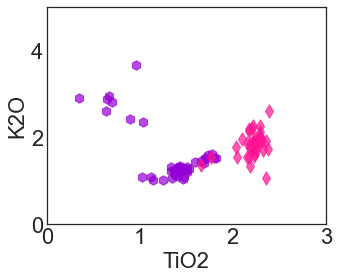

120713


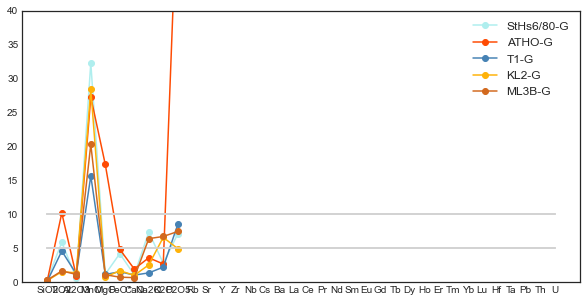

(218, 39)
120713


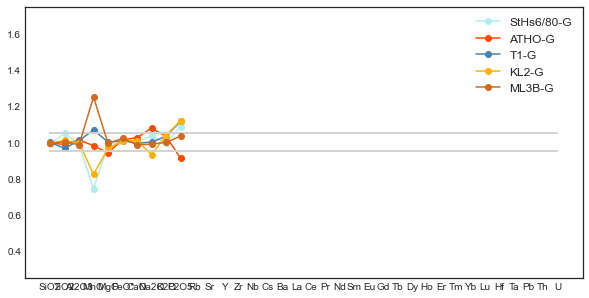

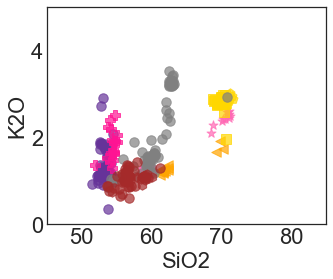

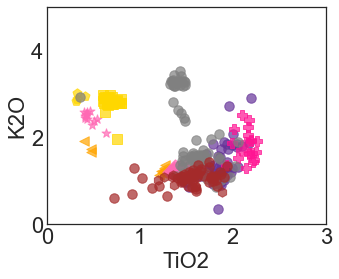

211013


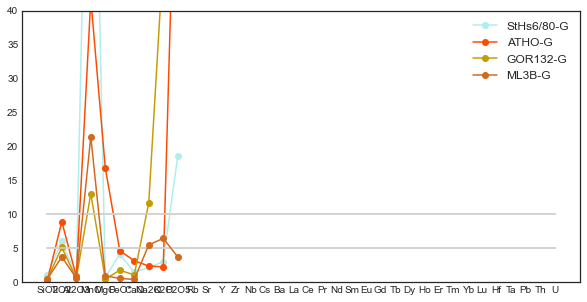

(218, 39)
211013


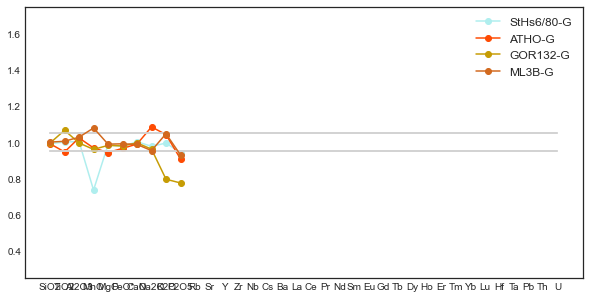

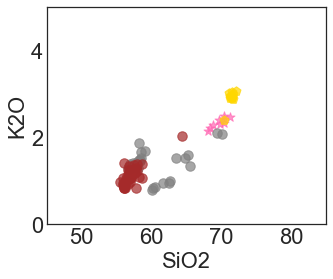

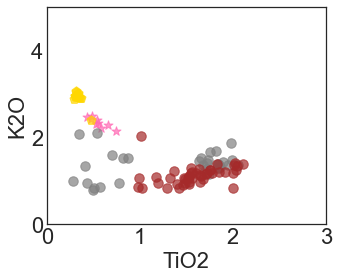

221013


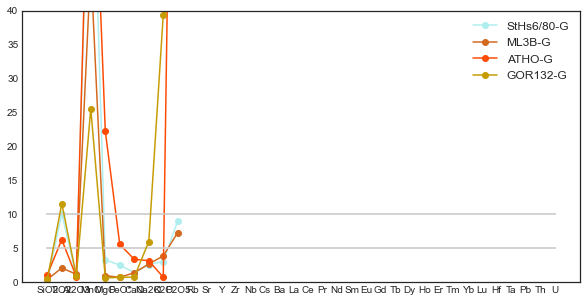

(218, 39)
221013


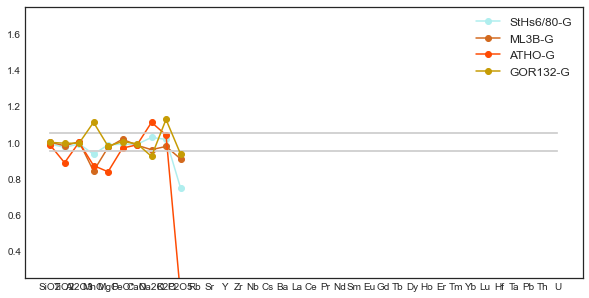

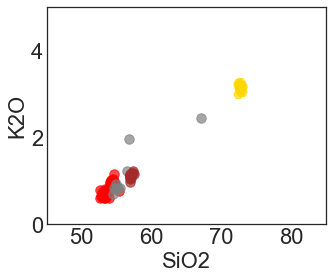

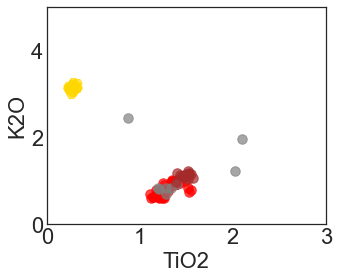

131213


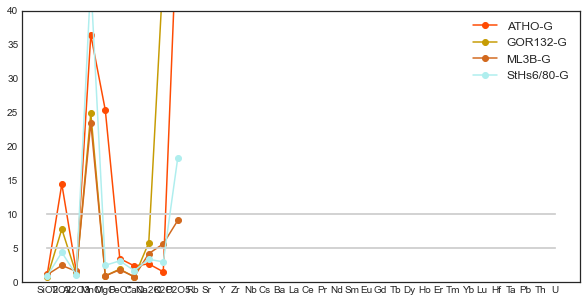

(218, 39)
131213


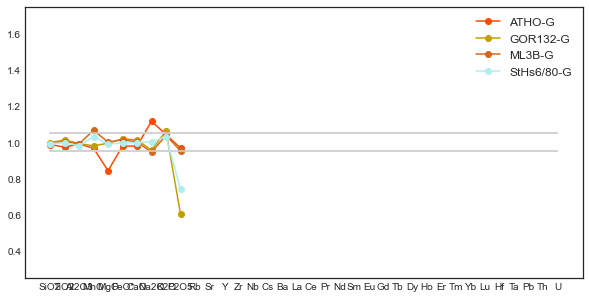

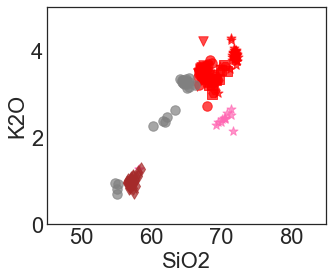

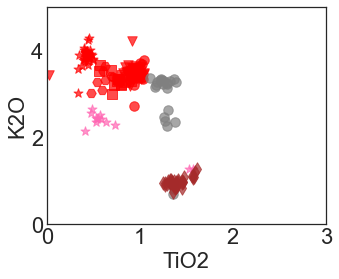

210114


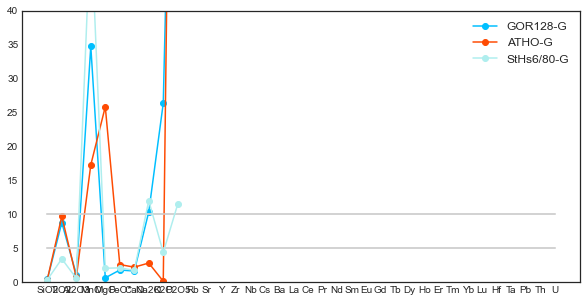

(218, 39)
210114


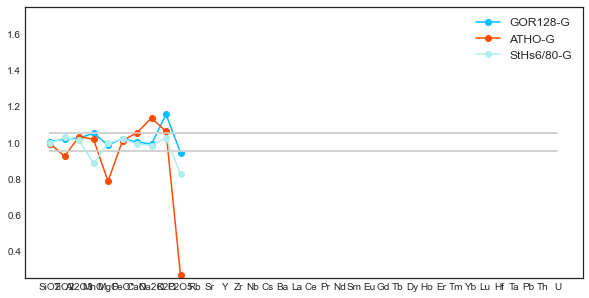

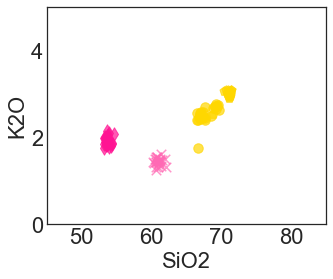

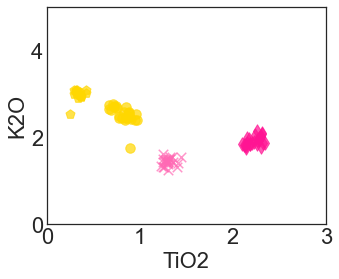

220114


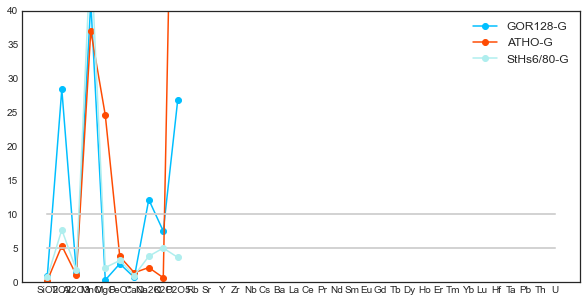

(218, 39)
220114


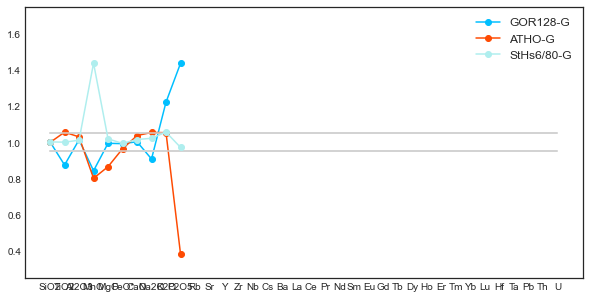

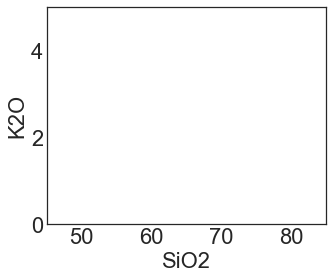

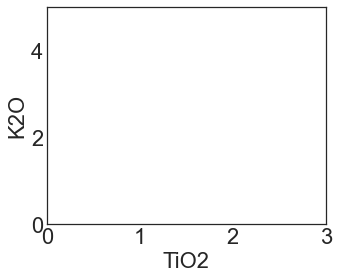

140214


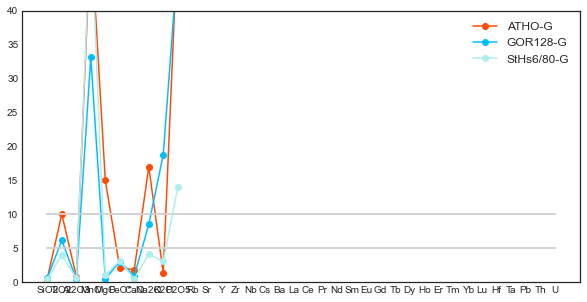

(218, 39)
140214


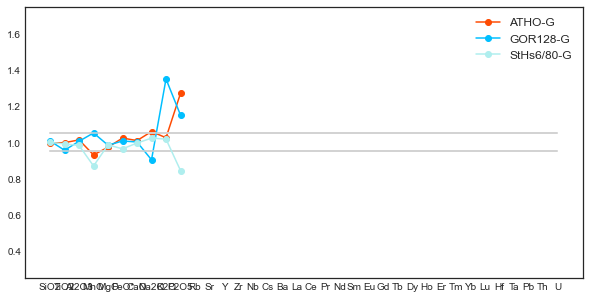

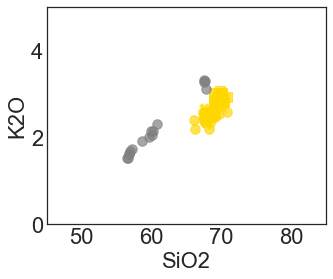

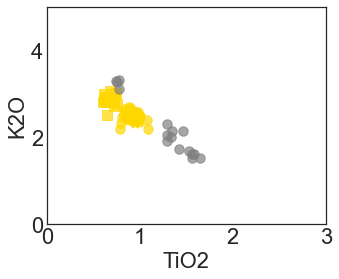

190314


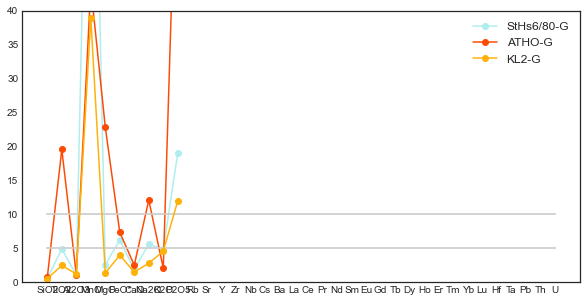

(218, 39)
190314


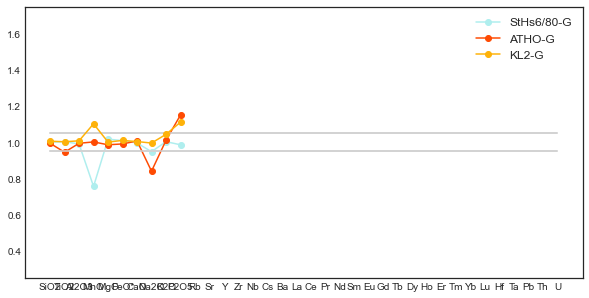

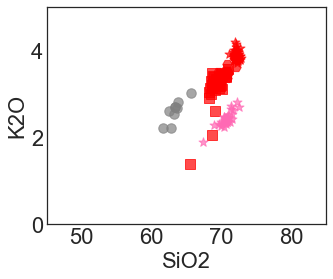

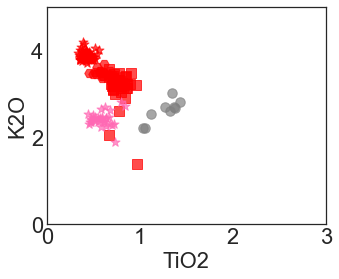

200314


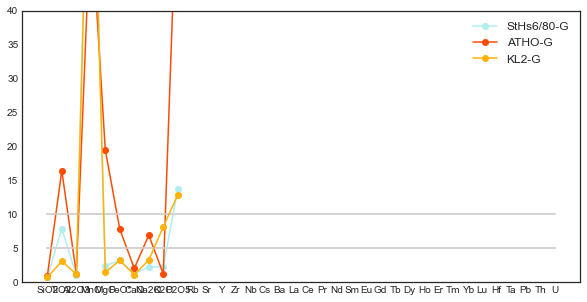

(218, 39)
200314


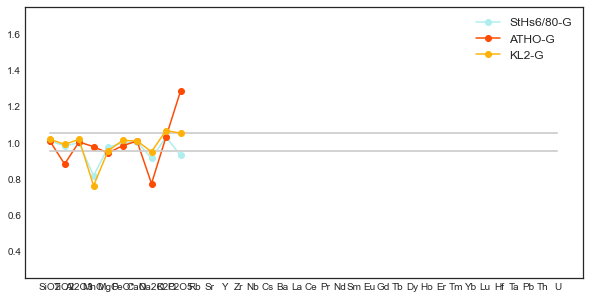

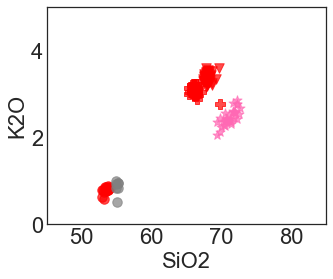

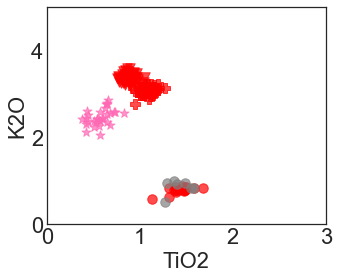

210314


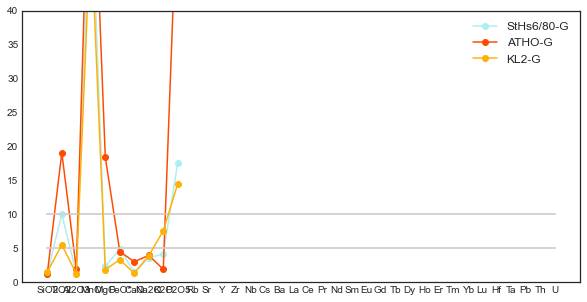

(218, 39)
210314


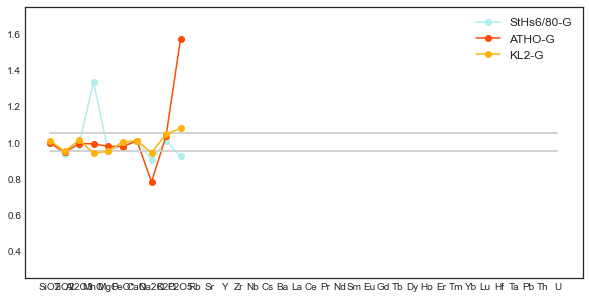

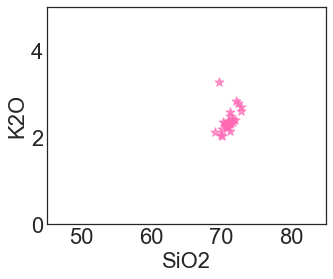

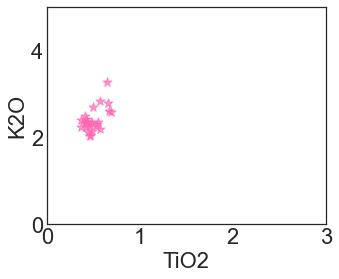

230714


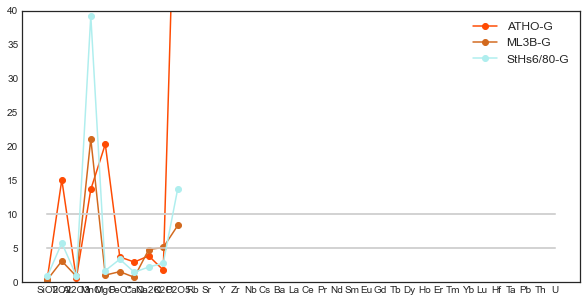

(218, 39)
230714


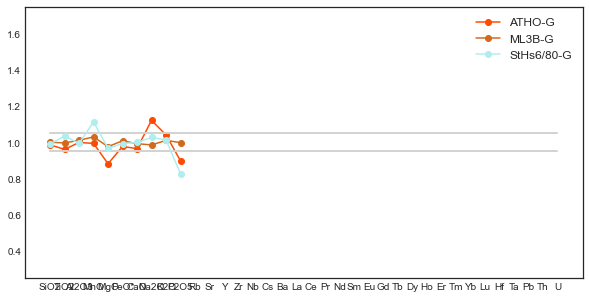

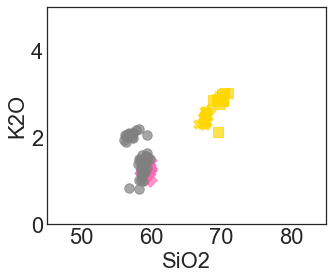

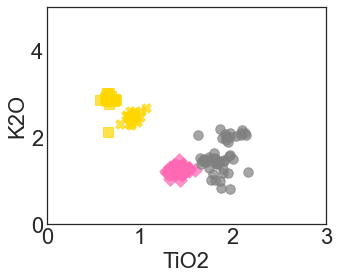

240714


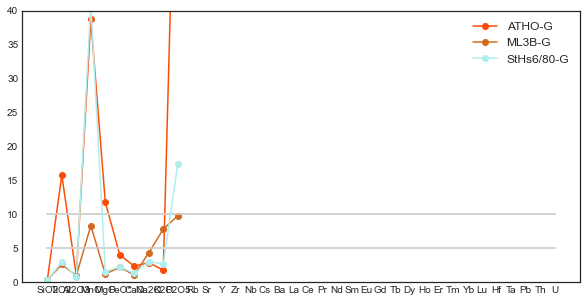

(218, 39)
240714


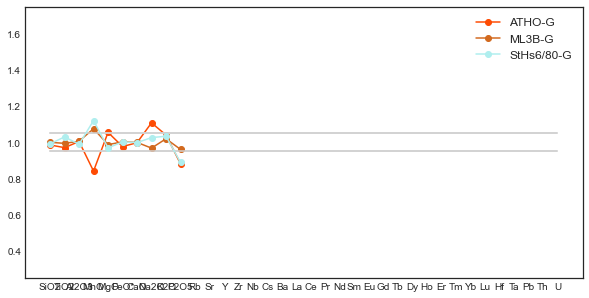

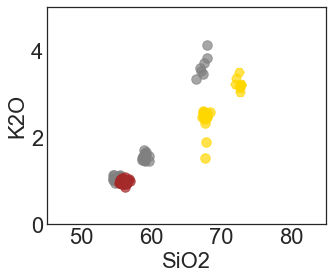

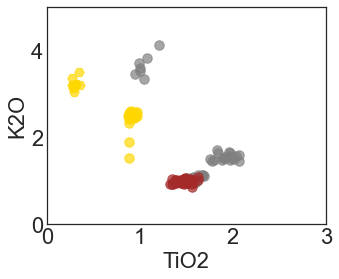

250714


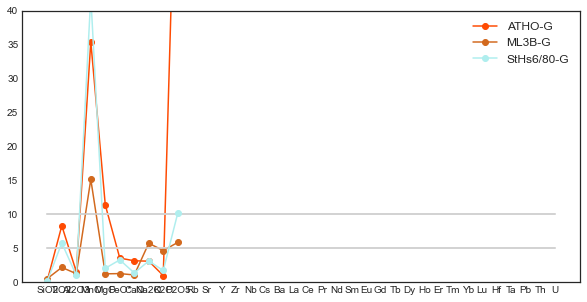

(218, 39)
250714


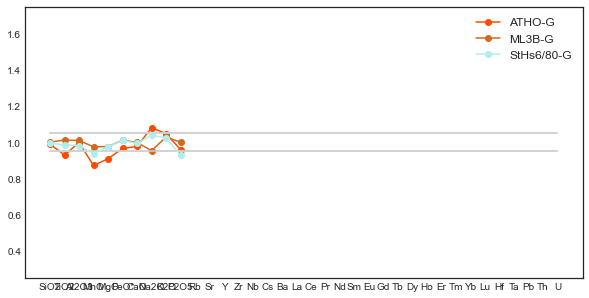

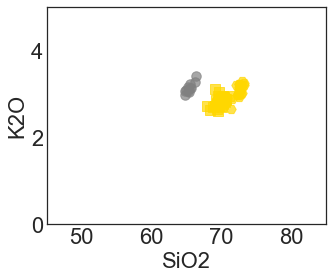

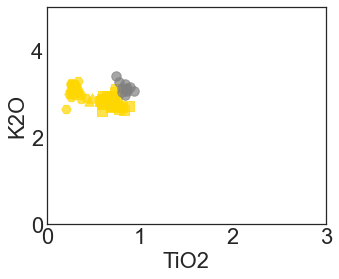

190115


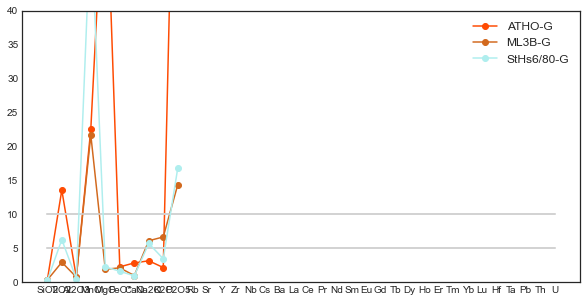

(218, 39)
190115


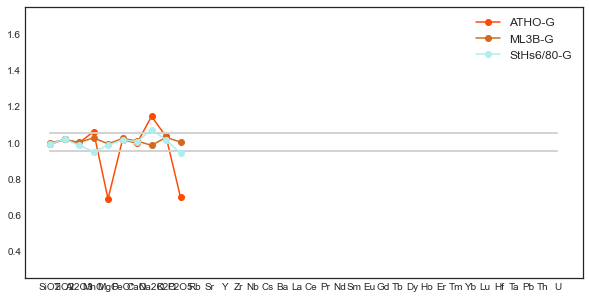

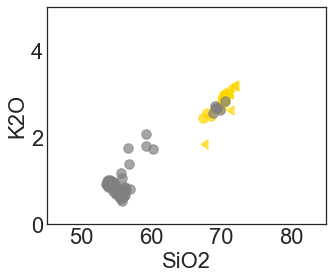

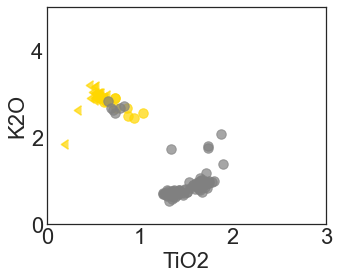

200115


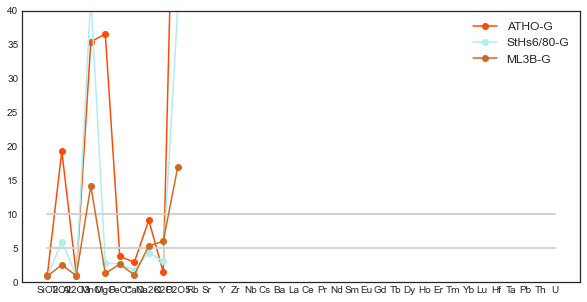

(218, 39)
200115


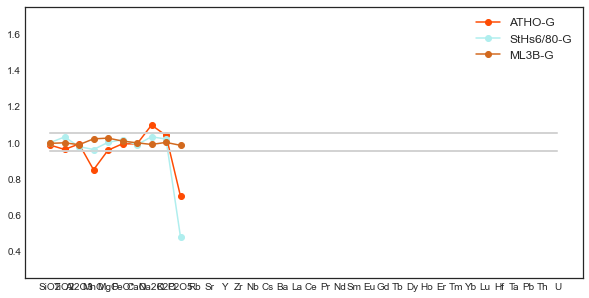

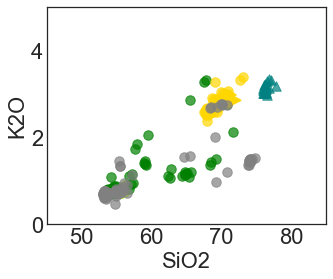

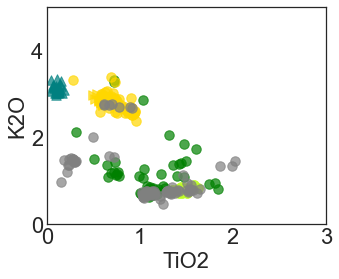

130415


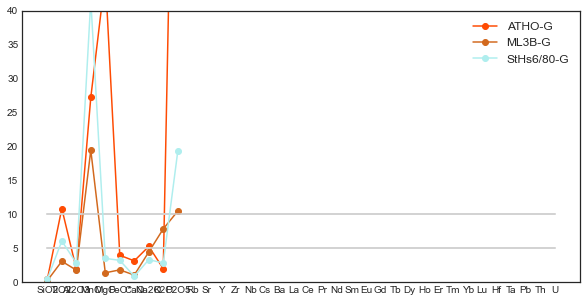

(218, 39)
130415


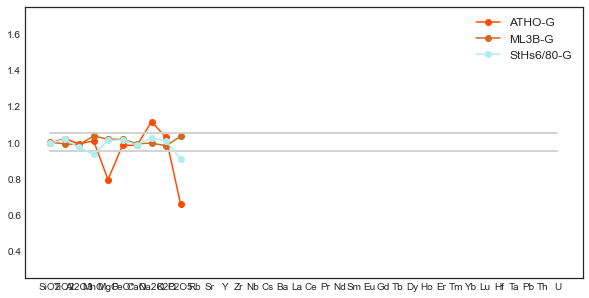

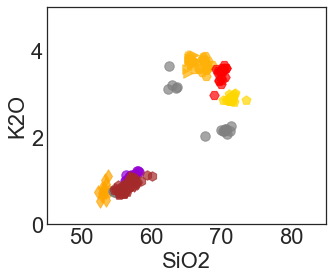

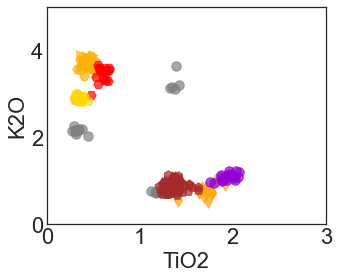

25th August, 2013


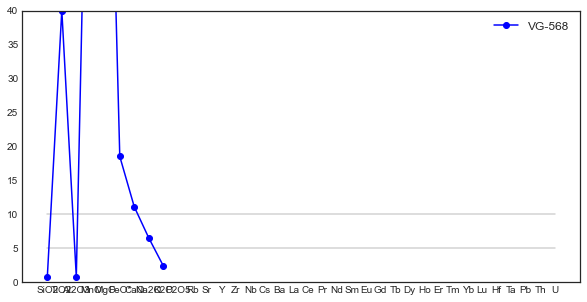

(218, 39)


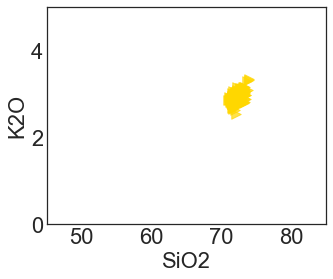

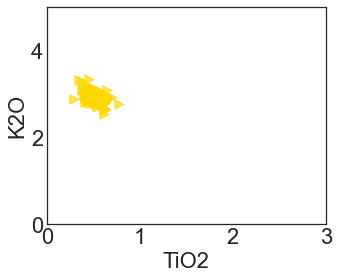

AllowaySOLICPMS2015


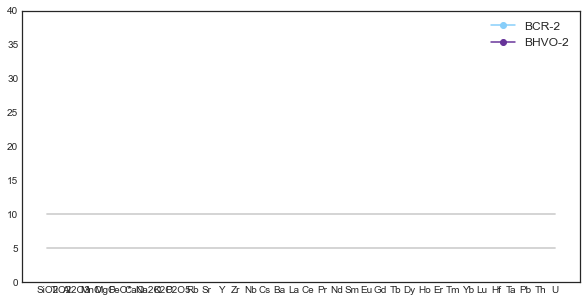

(218, 39)
AllowaySOLICPMS2015


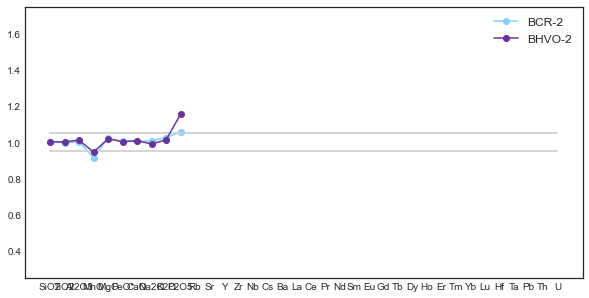

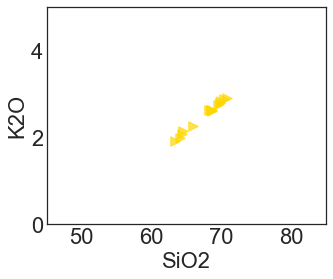

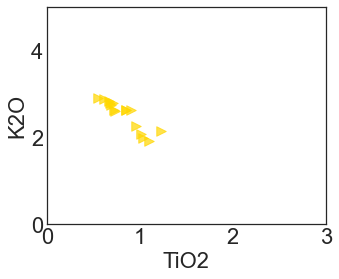

Morgado2019


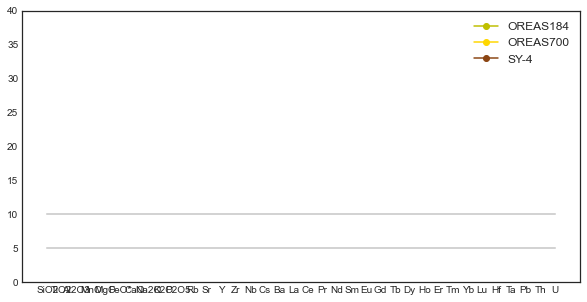

(218, 39)


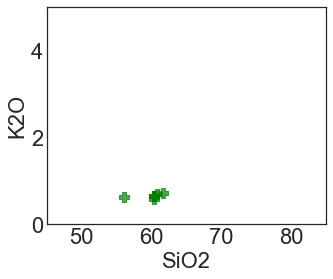

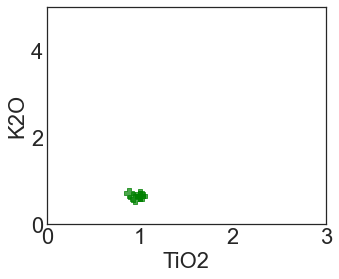

WellerICPMS


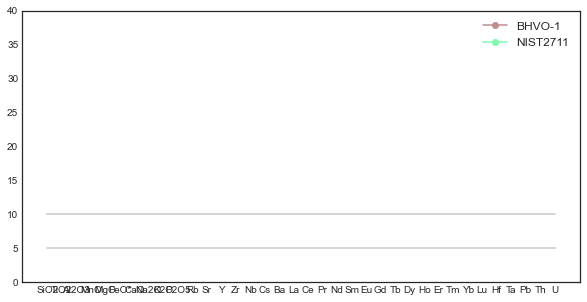

(218, 39)
WellerICPMS


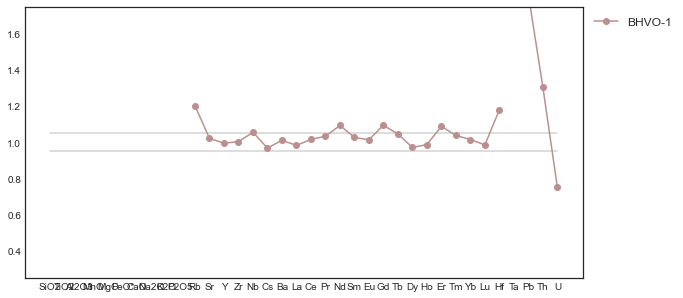

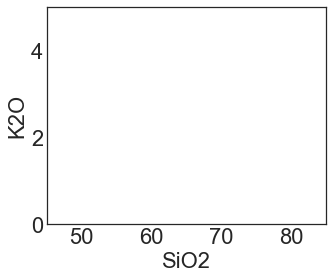

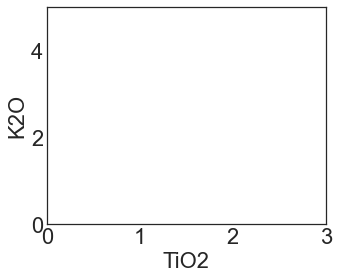

WellerEMP


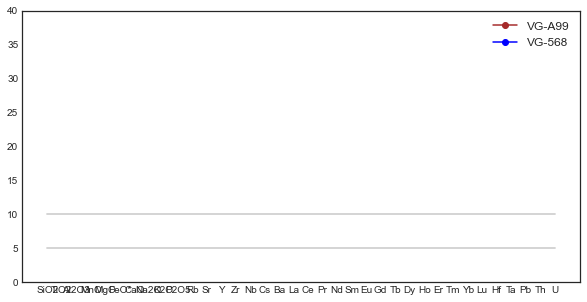

(218, 39)


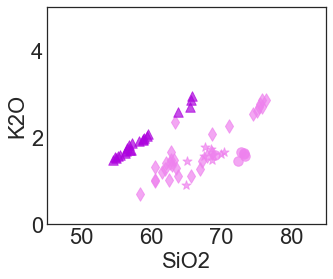

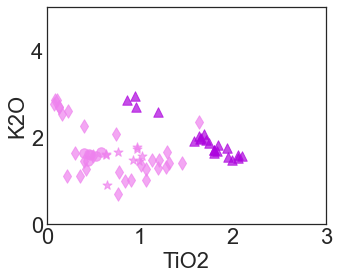

RUN1 June 2011


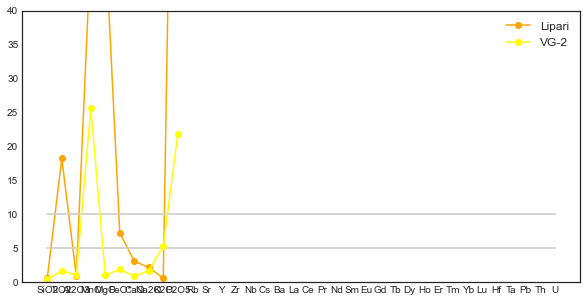

(218, 39)


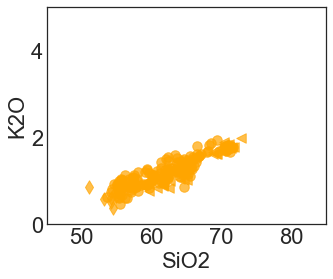

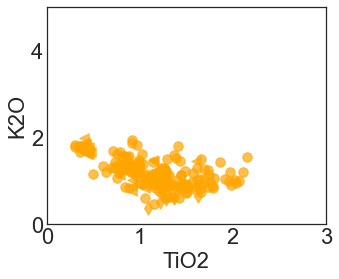

RUN2 June 2011


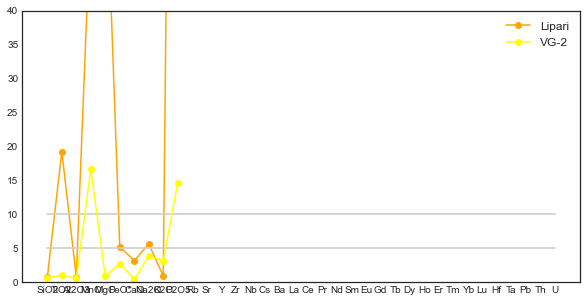

(218, 39)


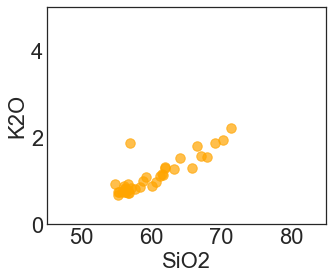

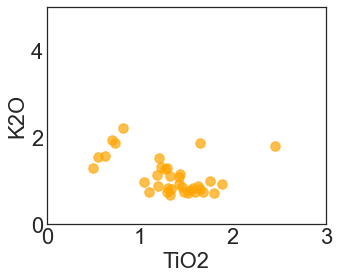

RUN3 June 2011


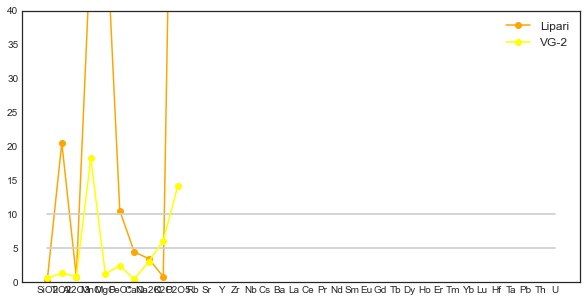

(218, 39)


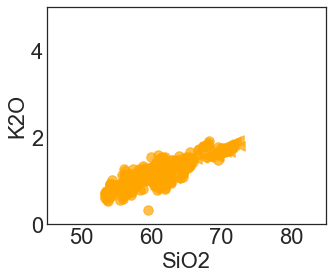

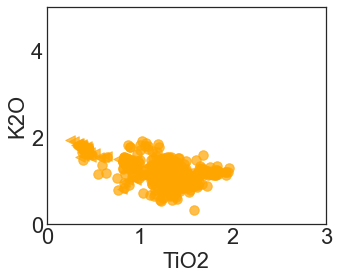

DelCarlo2018EMP


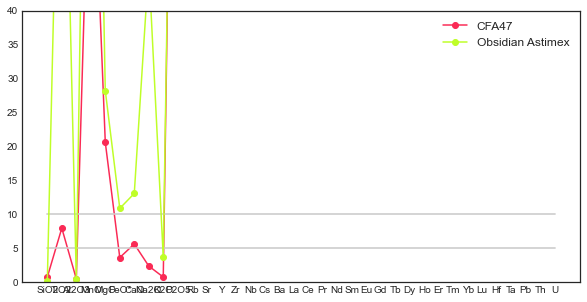

(218, 39)


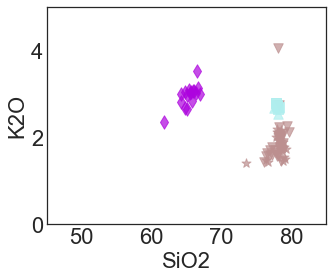

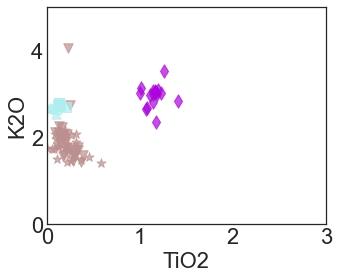

DelCarlo2018LAICPMS


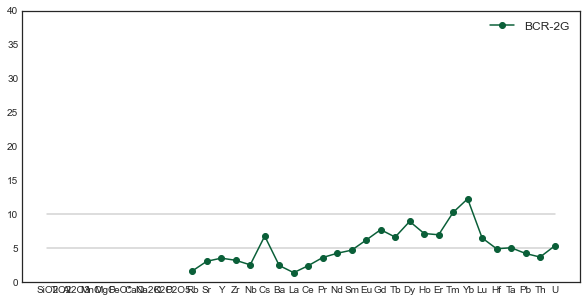

(218, 39)


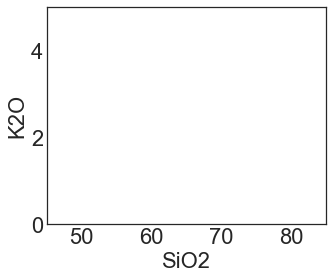

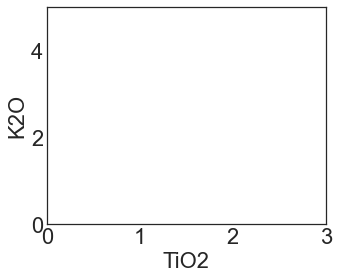

28-Jun-1-10


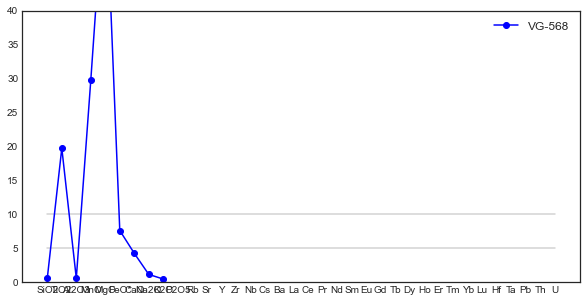

(218, 39)


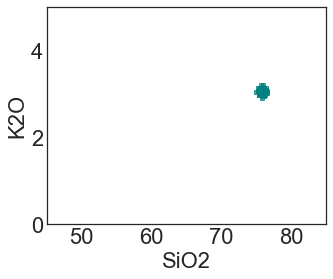

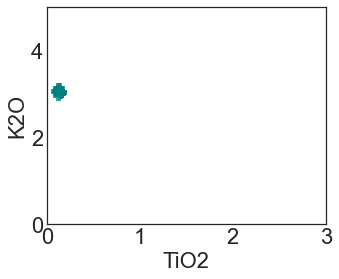

28-Jun-2-10


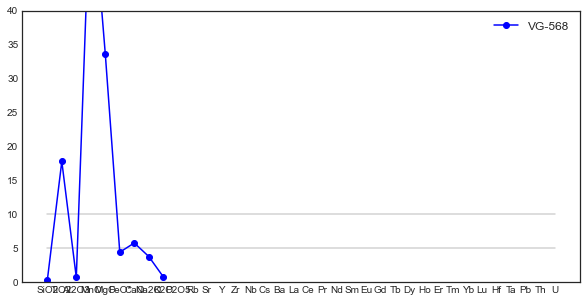

(218, 39)


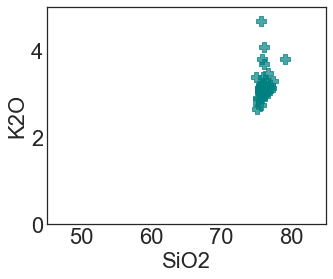

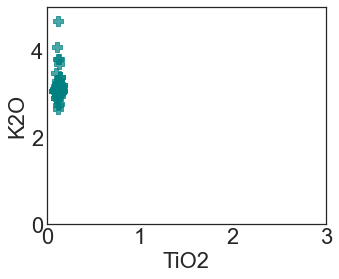

29-Jun-10


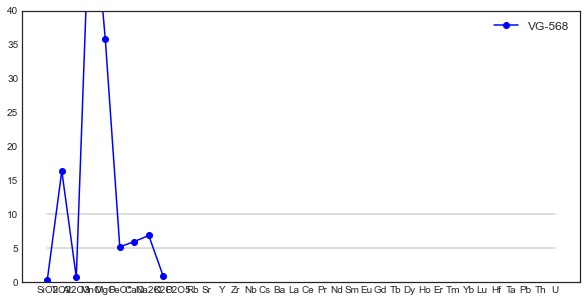

(218, 39)


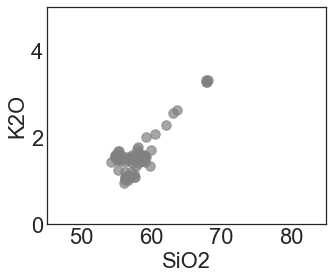

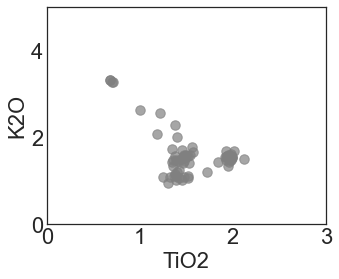

26-Jun-12


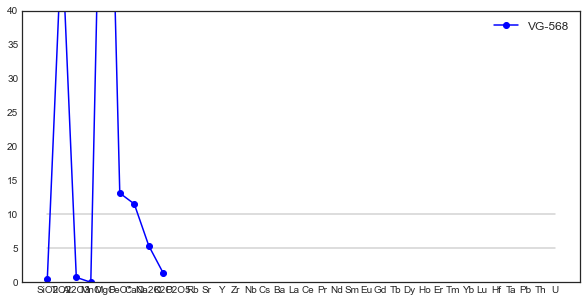

(218, 39)


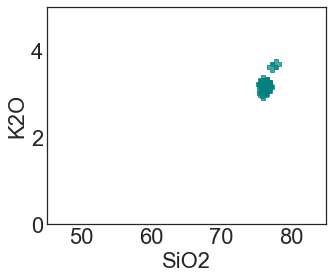

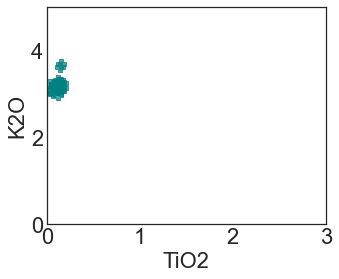

23-Ago-12


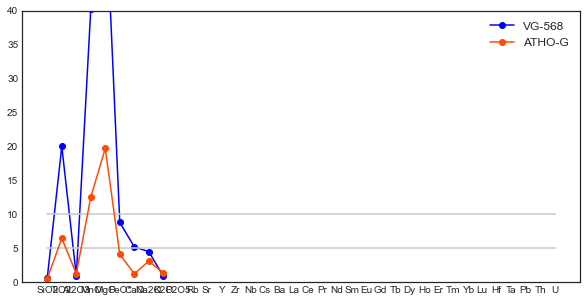

(218, 39)
23-Ago-12


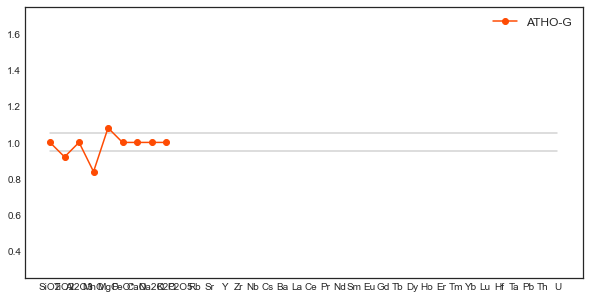

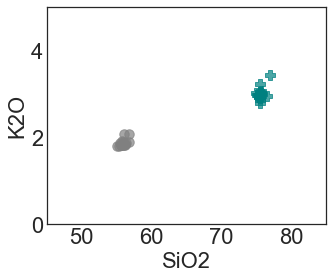

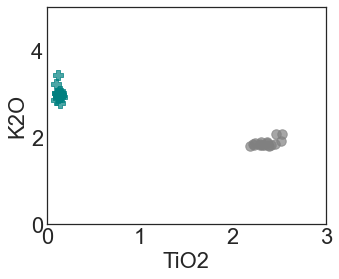

19-Abr-13


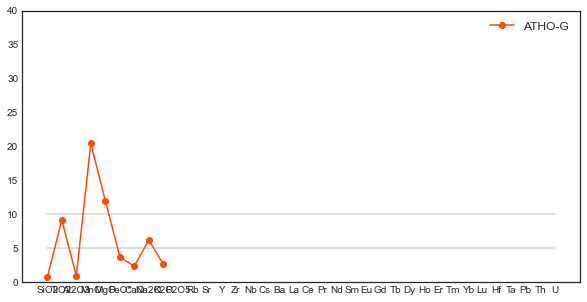

(218, 39)
19-Abr-13


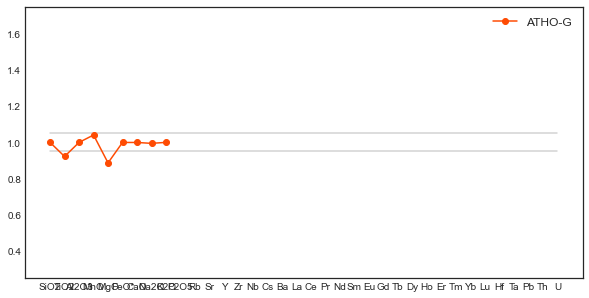

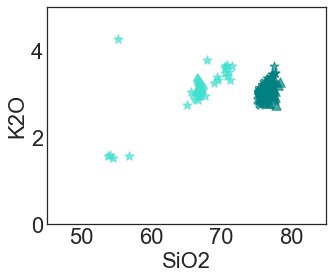

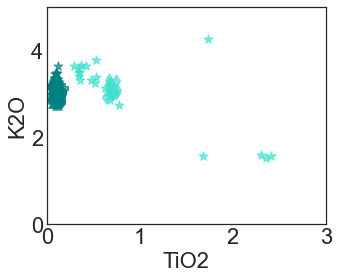

26-mar-15


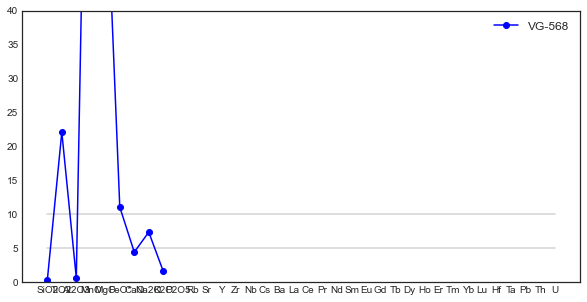

(218, 39)


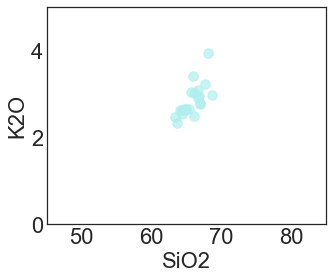

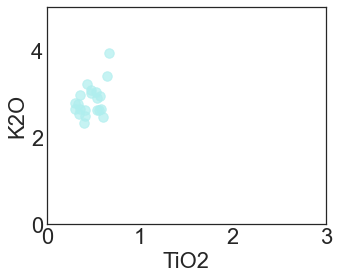

AllowayMay2014


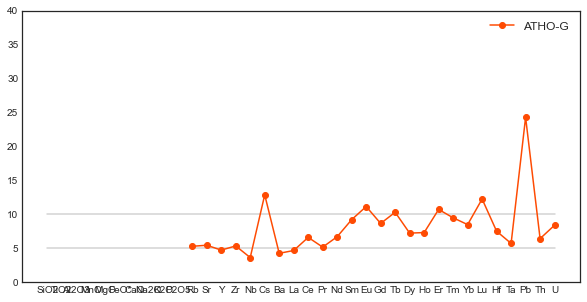

(218, 39)
AllowayMay2014


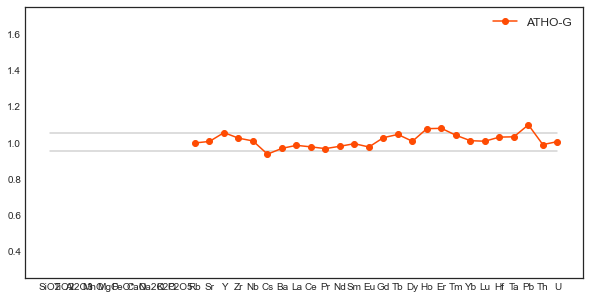

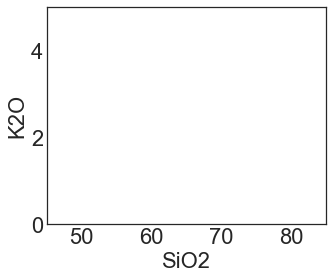

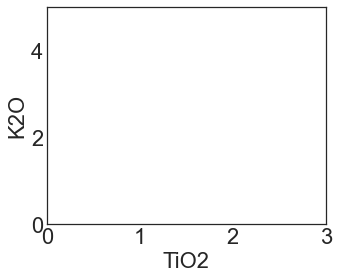

8-may-15


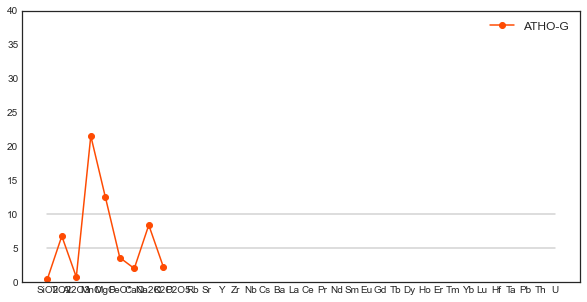

(218, 39)
8-may-15


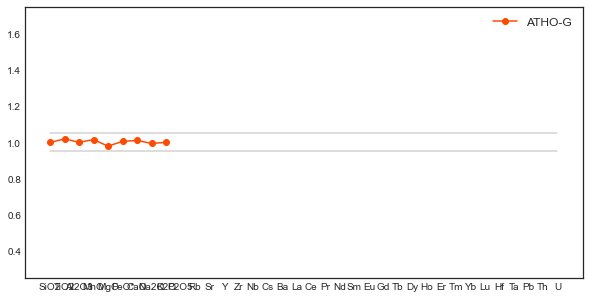

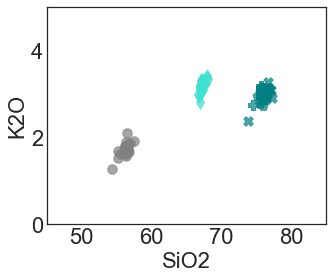

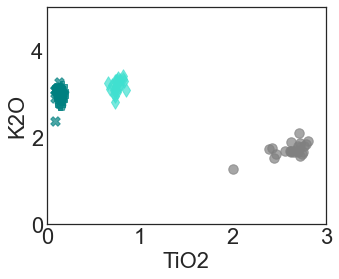

19-may-11


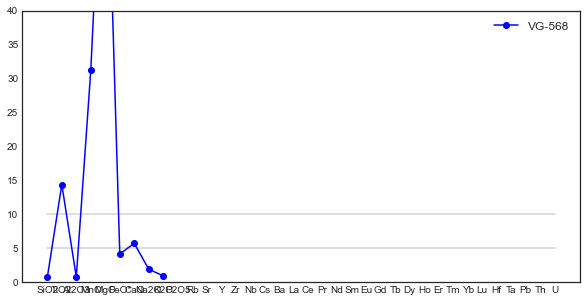

(218, 39)


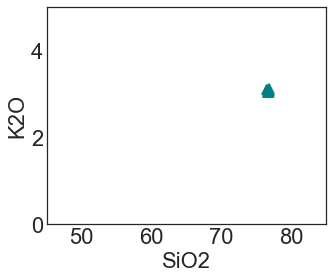

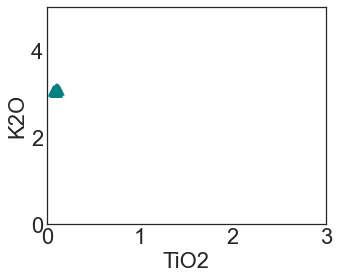

16-abr-13


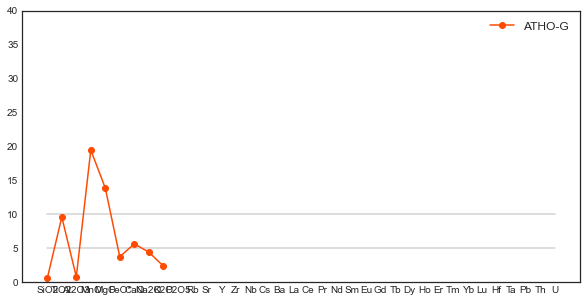

(218, 39)
16-abr-13


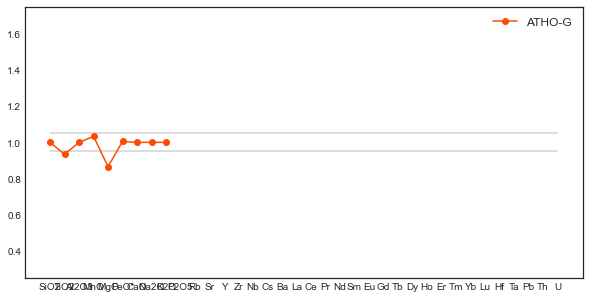

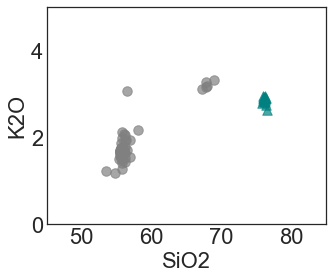

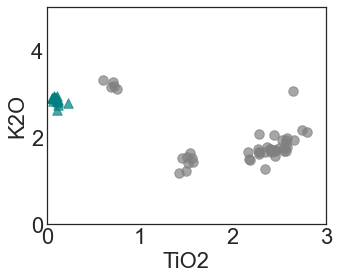

12-sept-14


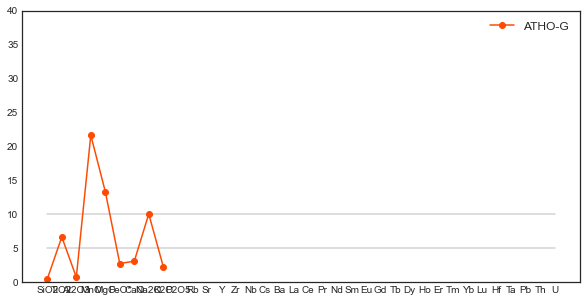

(218, 39)
12-sept-14


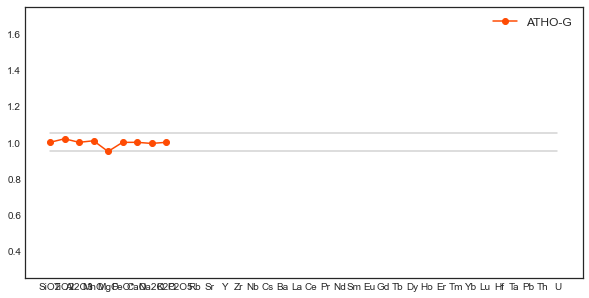

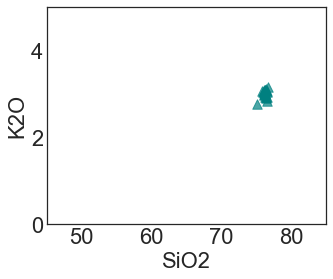

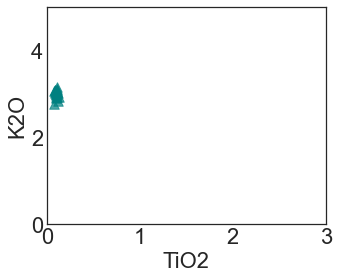

31-oct-15


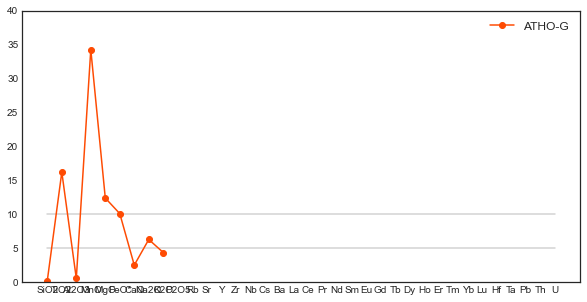

(218, 39)
31-oct-15


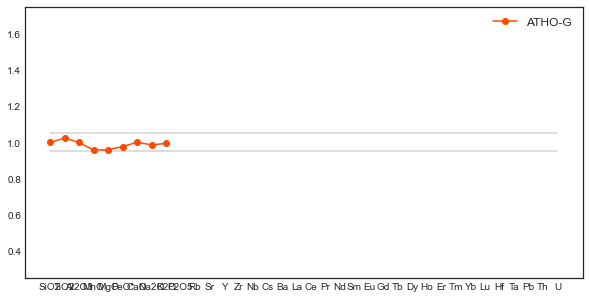

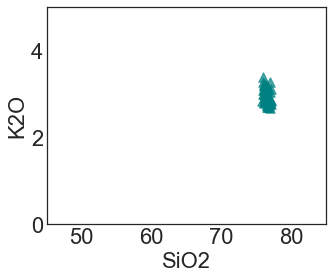

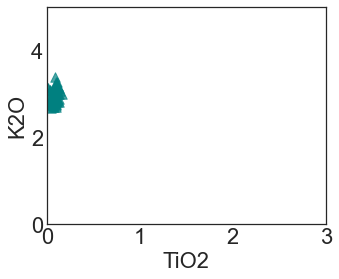

Jacques2014


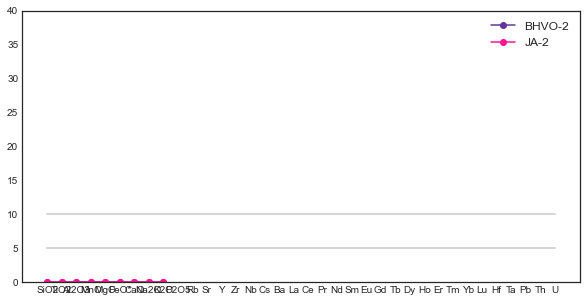

(218, 39)
Jacques2014


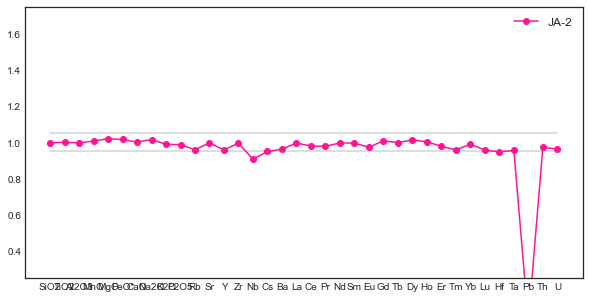

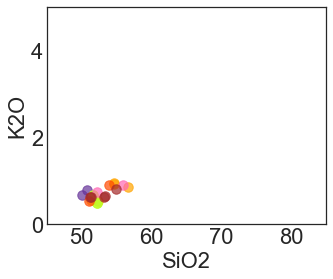

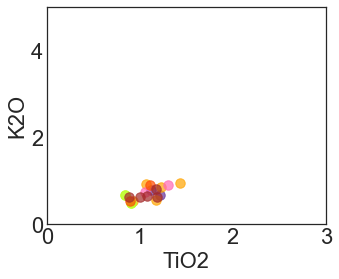

Rawson2016


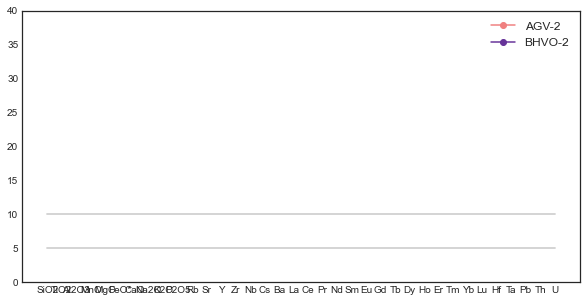

(218, 39)
Rawson2016


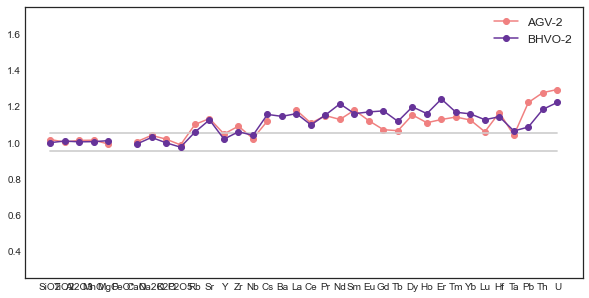

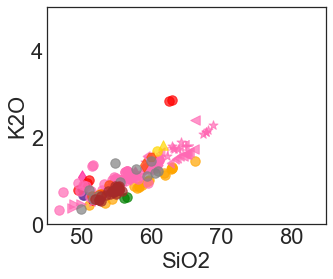

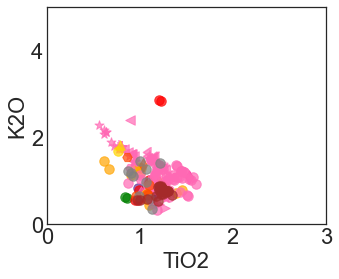

Alloway2017bCopy


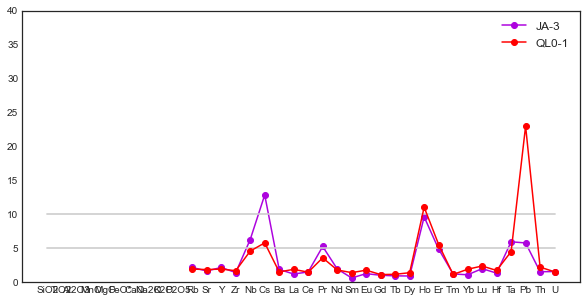

(218, 39)


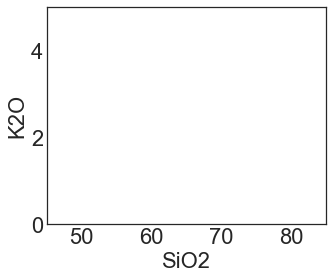

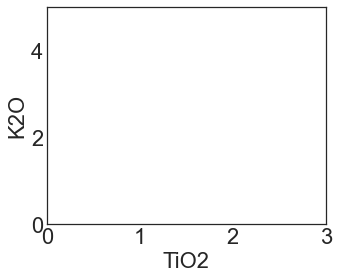

Geoffroy2018Trace


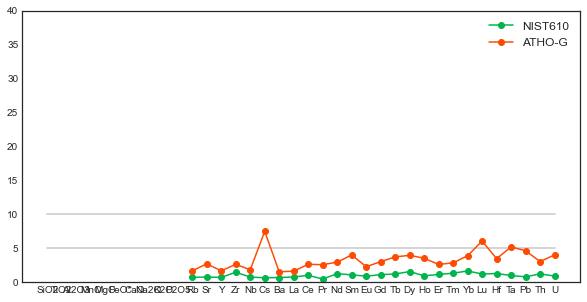

(218, 39)
Geoffroy2018Trace


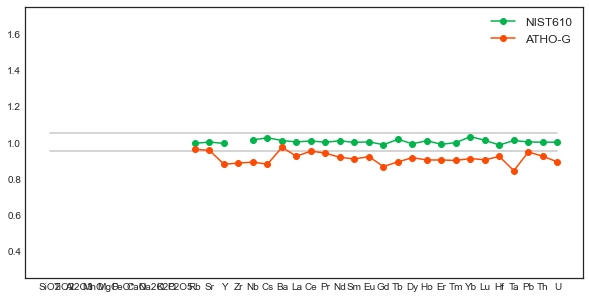

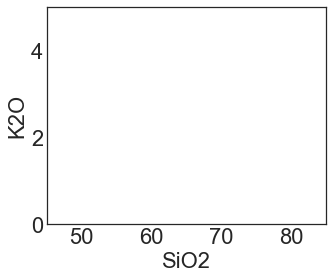

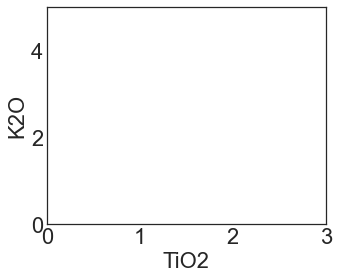

Geoffroy2018Major10um


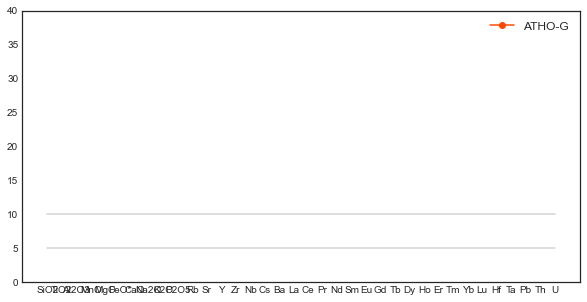

(218, 39)
Geoffroy2018Major10um


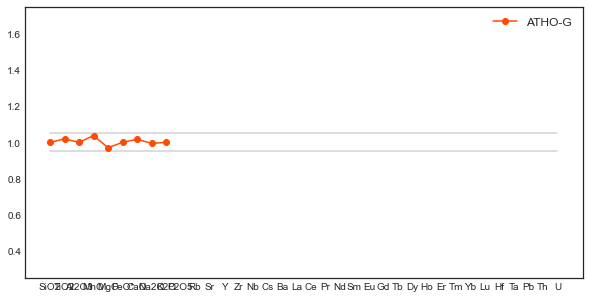

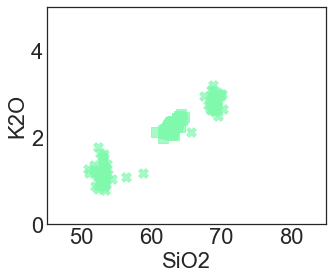

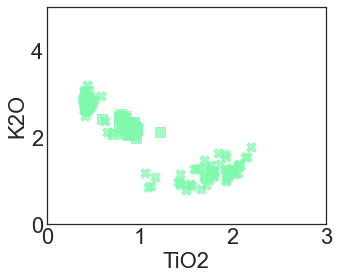

Geoffroy2018MajorSpot


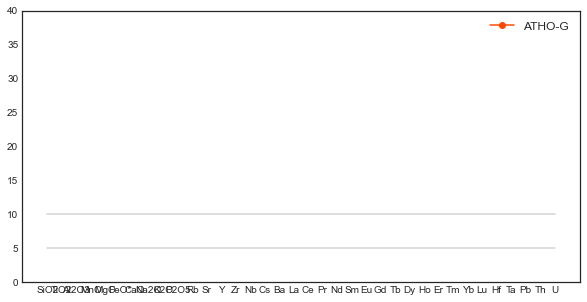

(218, 39)
Geoffroy2018MajorSpot


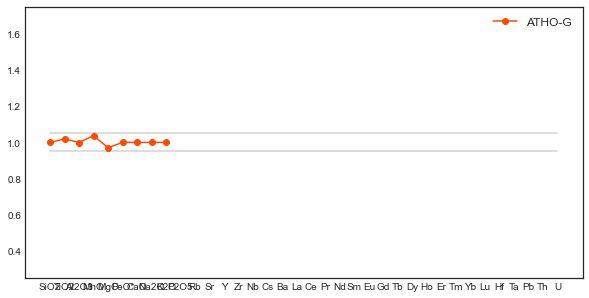

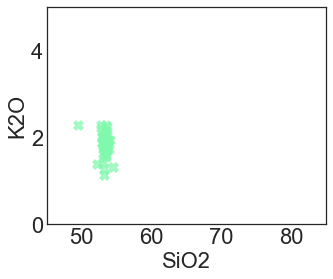

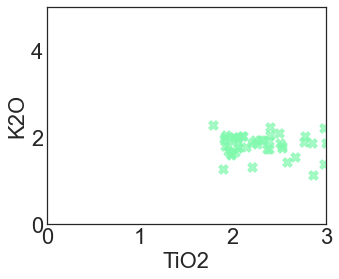

Geoffroy2018TracePBN


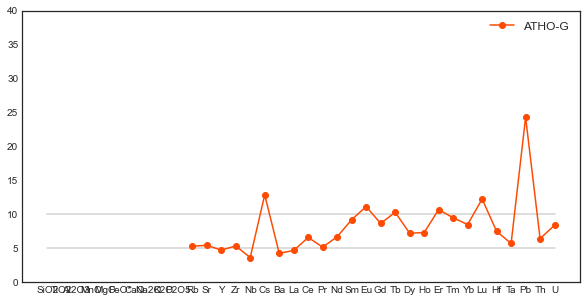

(218, 39)
Geoffroy2018TracePBN


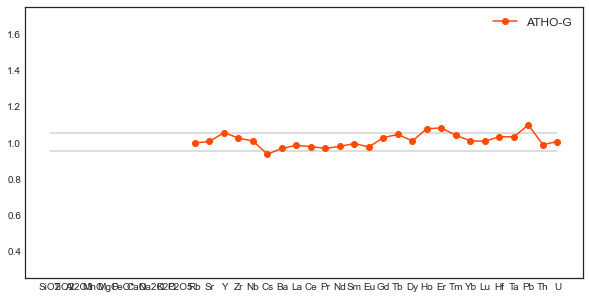

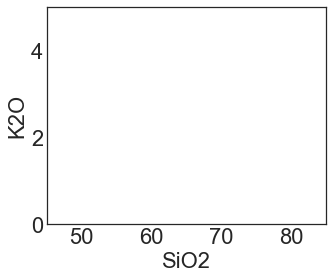

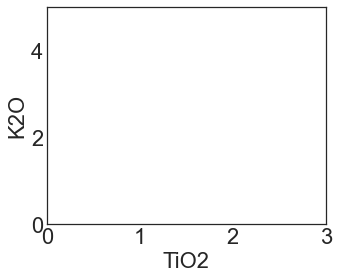

Brahm2018


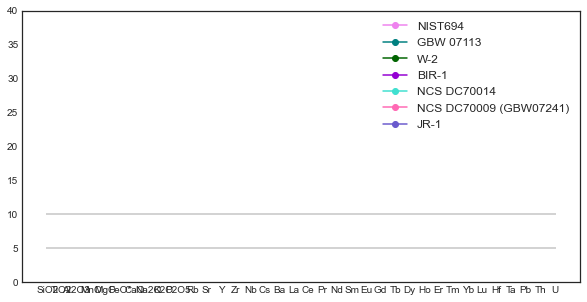

(218, 39)
Brahm2018


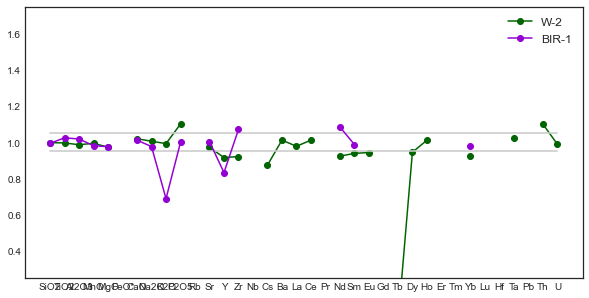

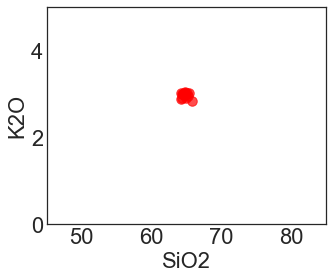

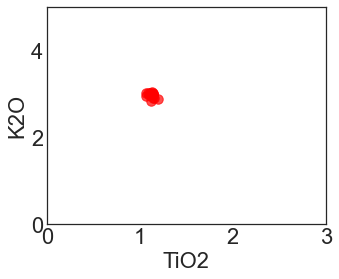

Carel2011Sept


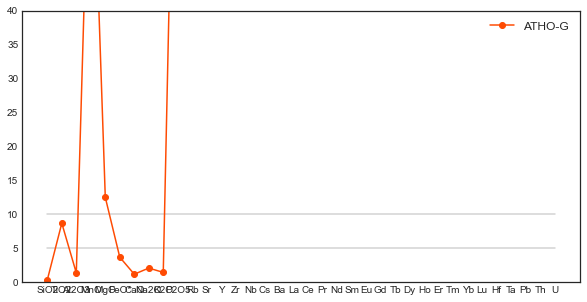

(218, 39)
Carel2011Sept


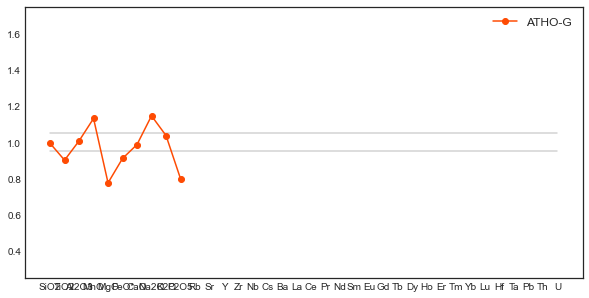

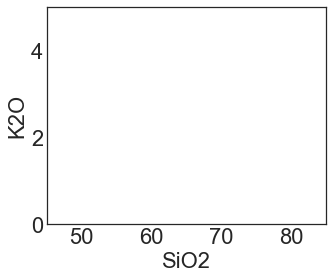

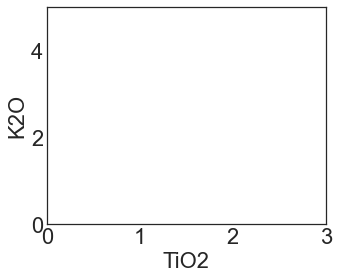

Carel2011Dec


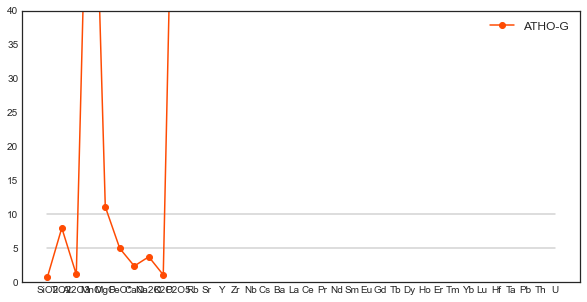

(218, 39)
Carel2011Dec


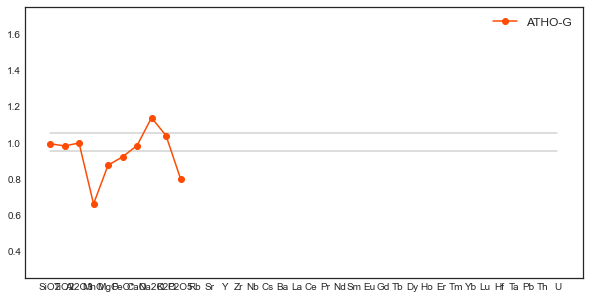

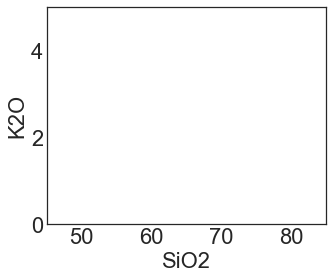

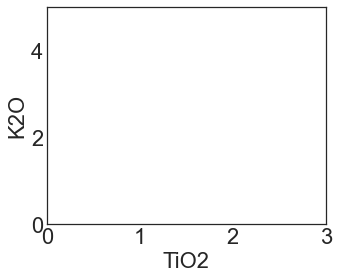

Carel2011


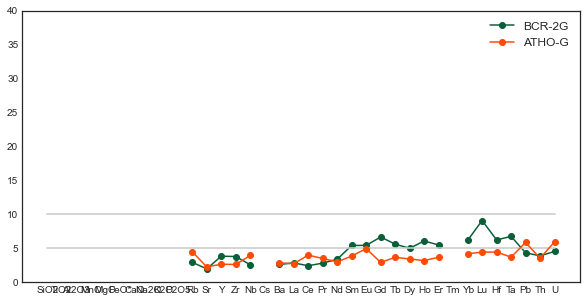

(218, 39)
Carel2011


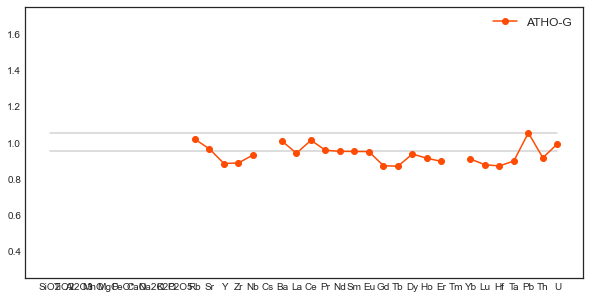

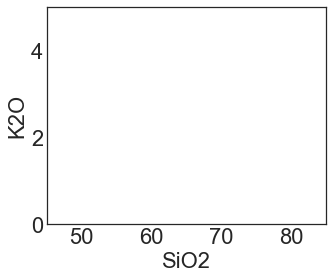

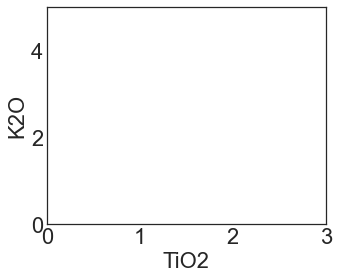

Gerlach1989


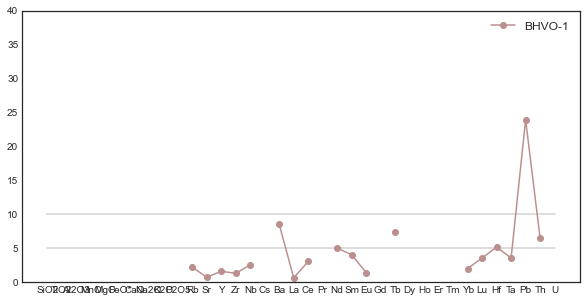

(218, 39)
Gerlach1989


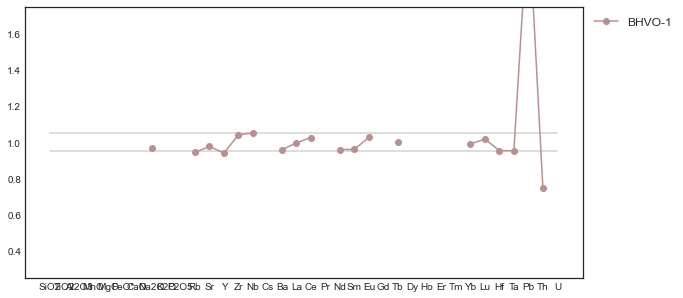

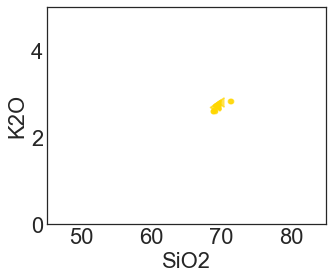

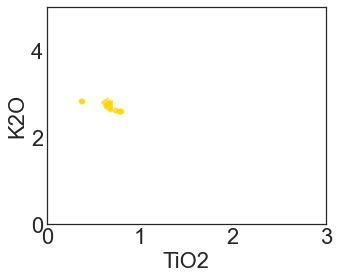

260117


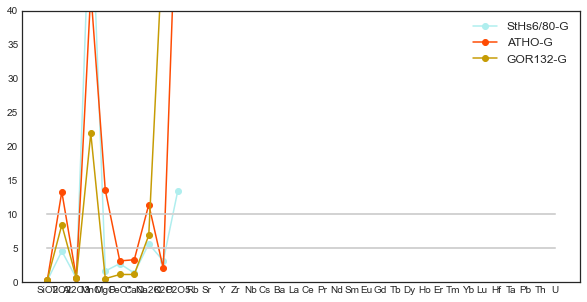

(218, 39)
260117


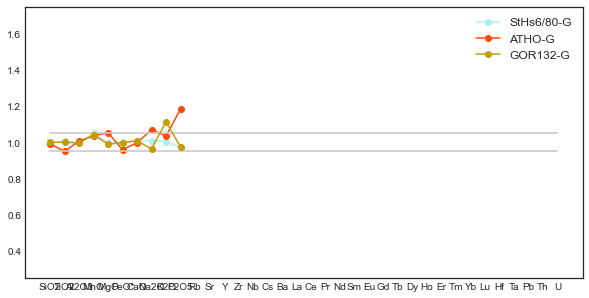

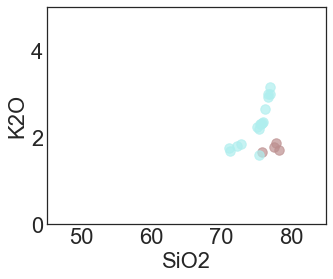

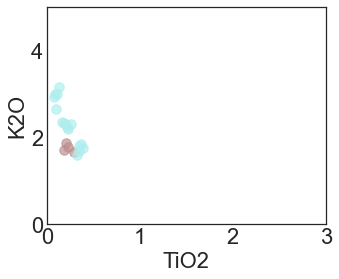

40917


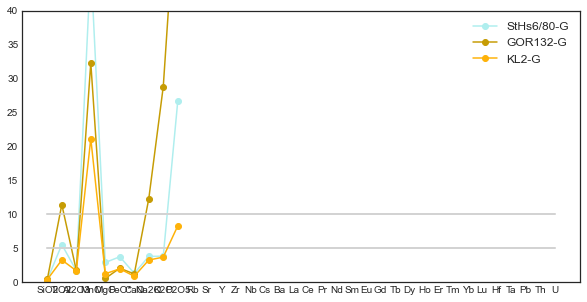

(218, 39)
40917


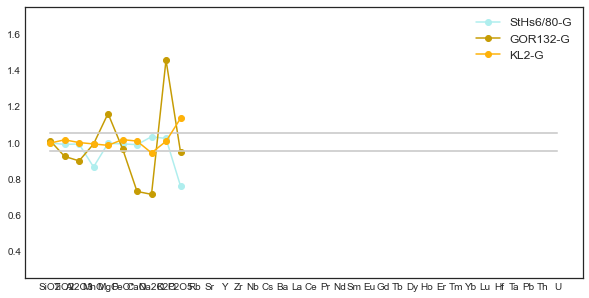

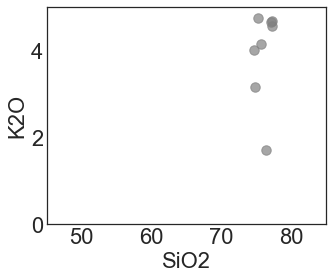

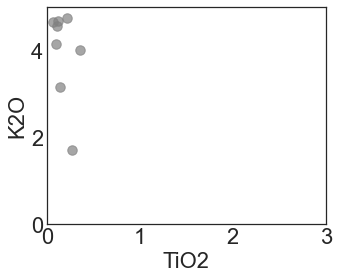

50717


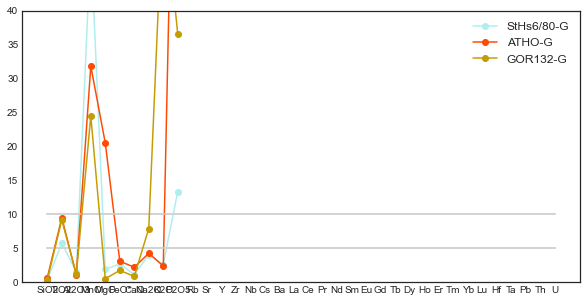

(218, 39)
50717


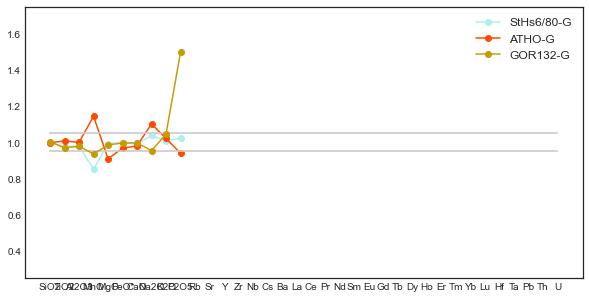

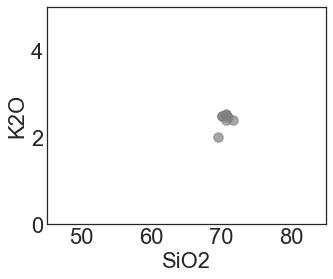

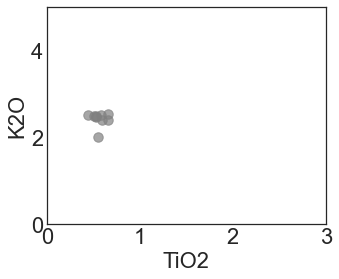

80917


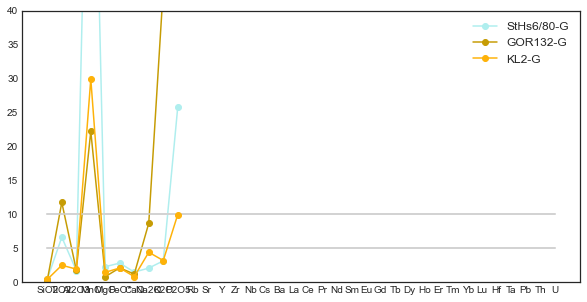

(218, 39)
80917


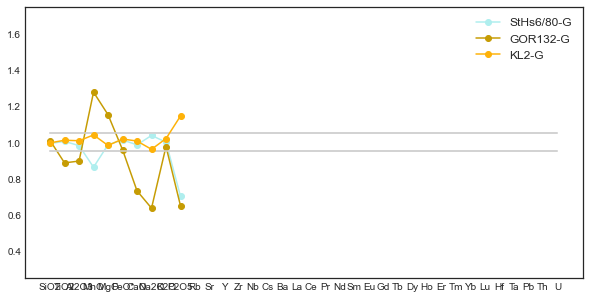

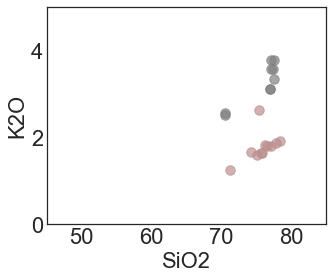

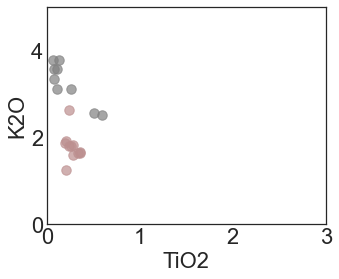

231017


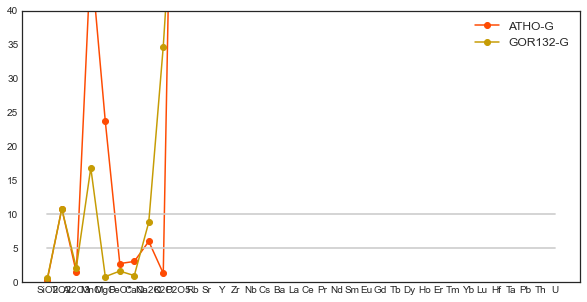

(218, 39)
231017


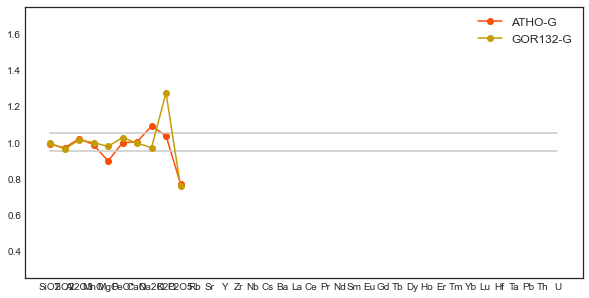

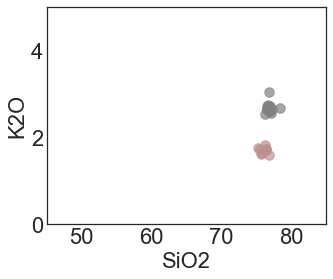

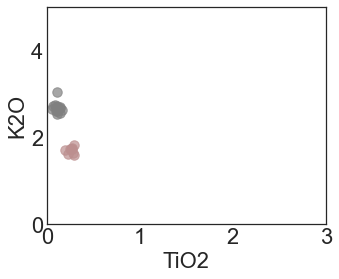

270118


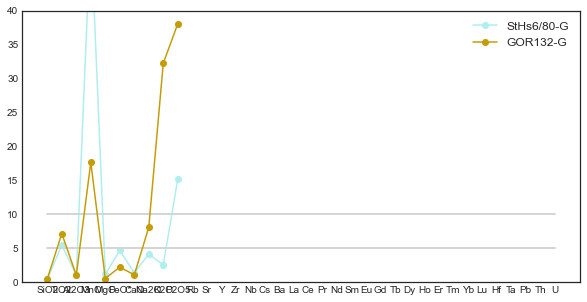

(218, 39)
270118


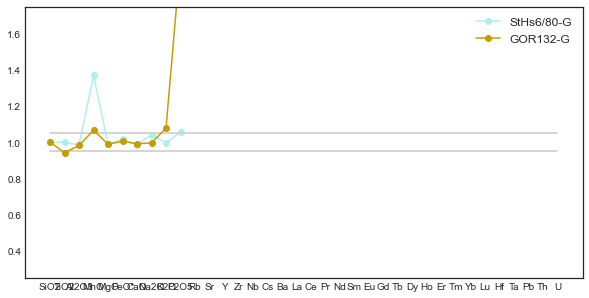

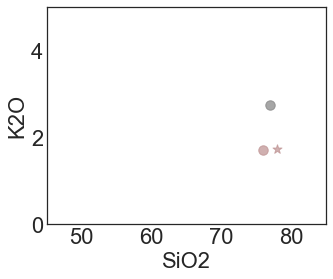

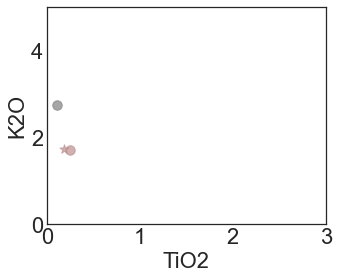

270118


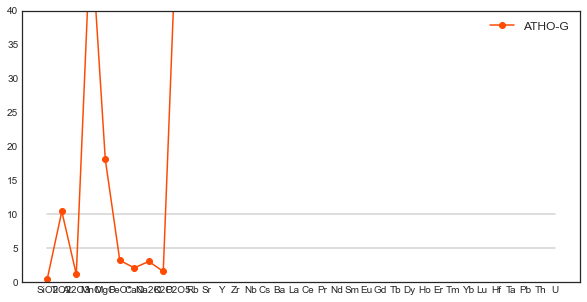

(218, 39)
270118


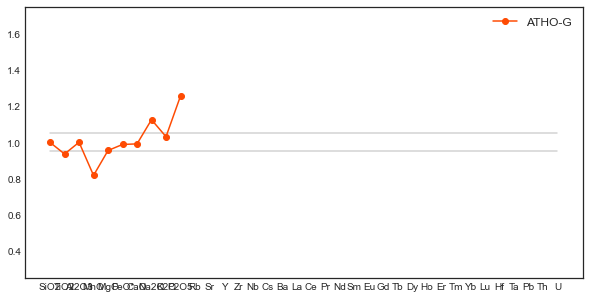

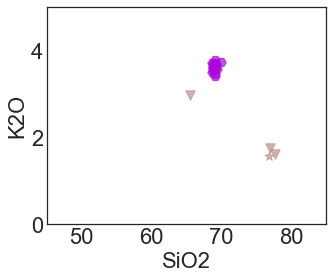

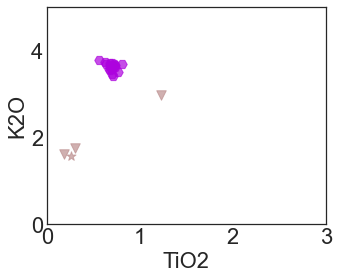

200318


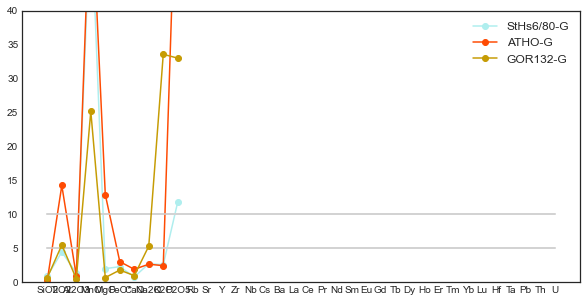

(218, 39)
200318


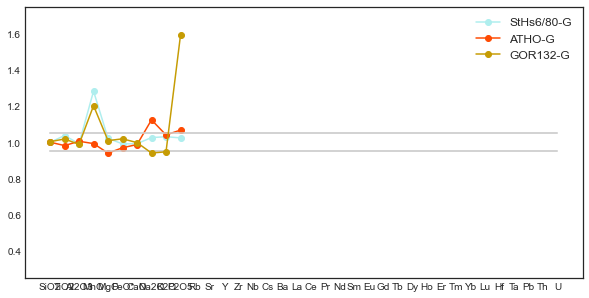

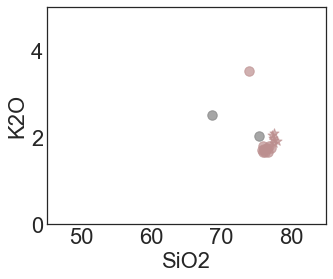

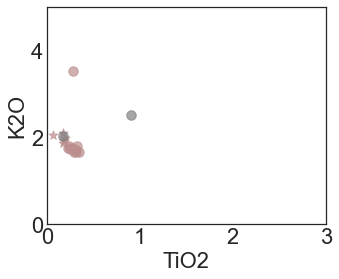

050318


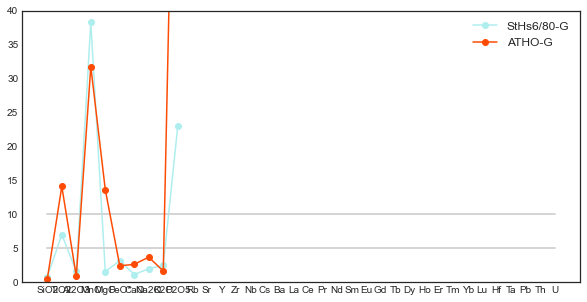

(218, 39)
050318


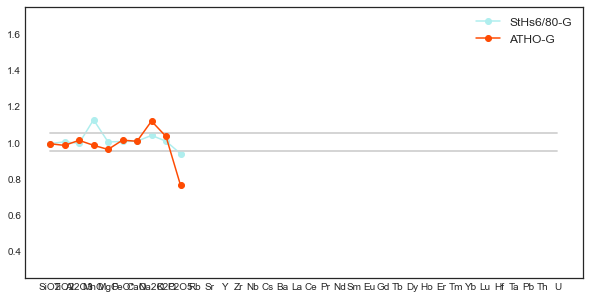

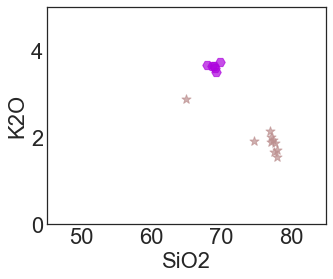

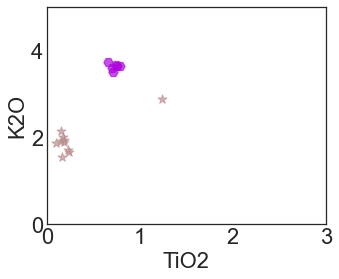

190816


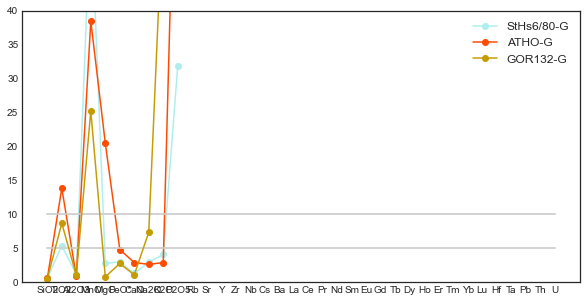

(218, 39)
190816


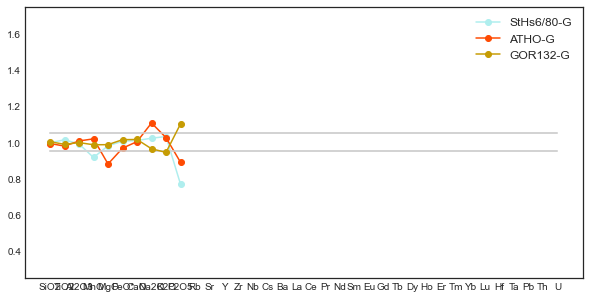

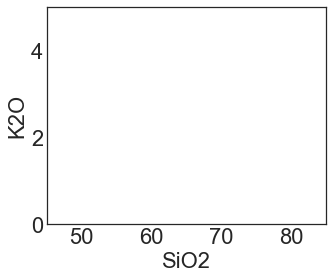

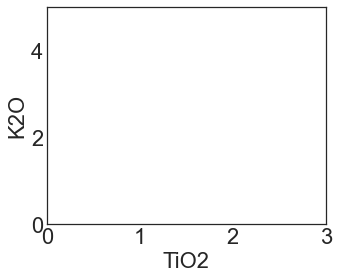

240117


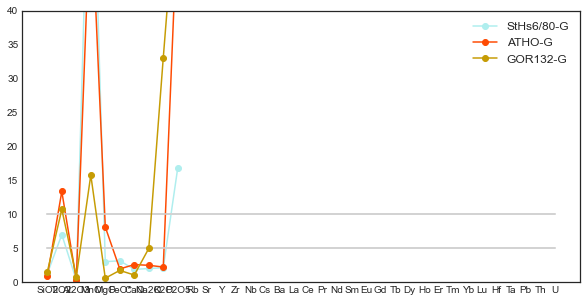

(218, 39)
240117


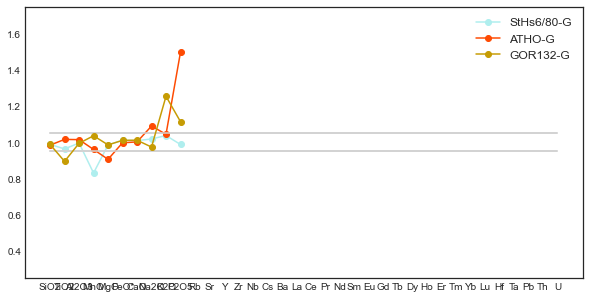

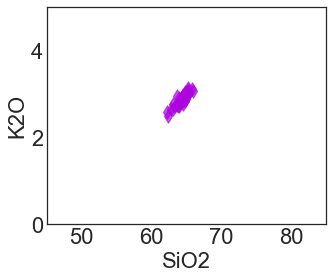

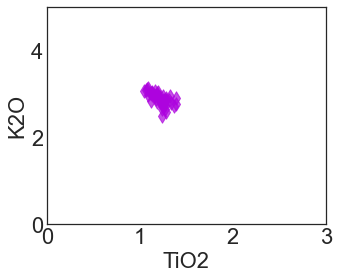

250117


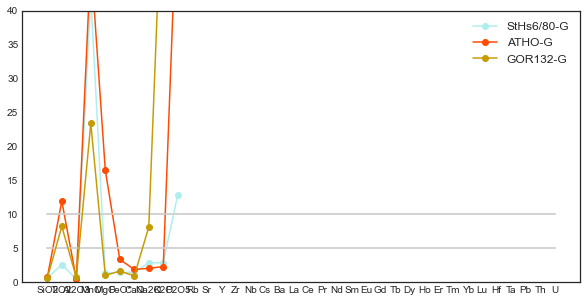

(218, 39)
250117


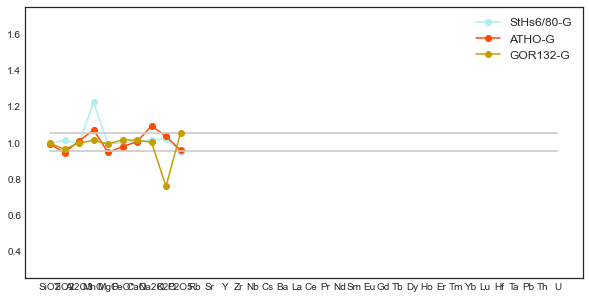

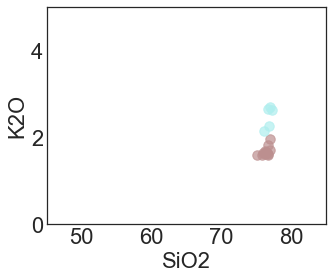

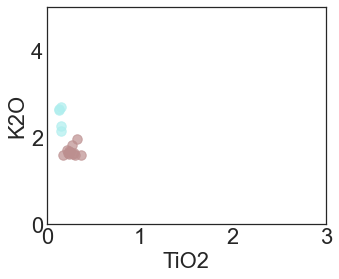

270217


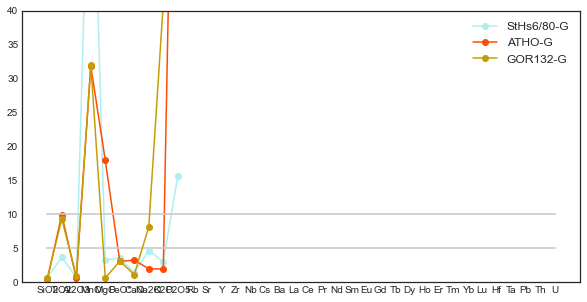

(218, 39)
270217


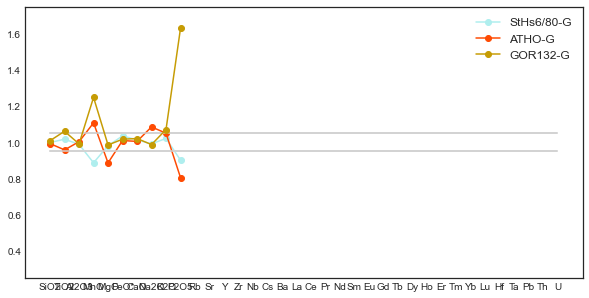

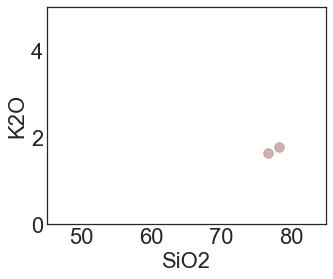

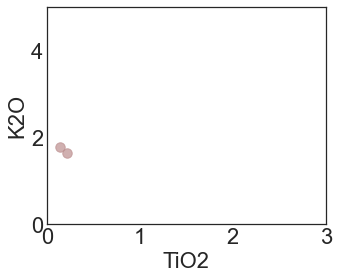

280217


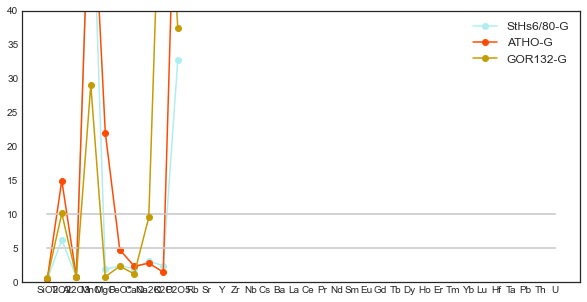

(218, 39)
280217


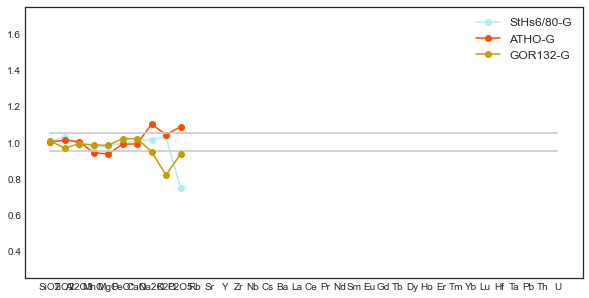

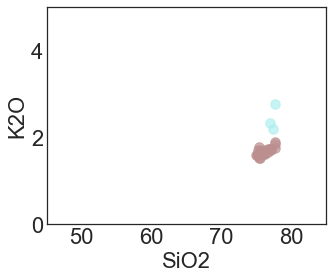

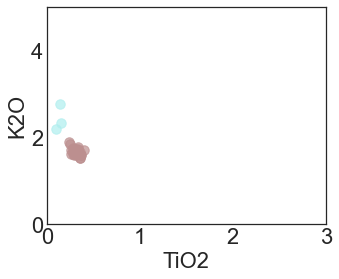

270918


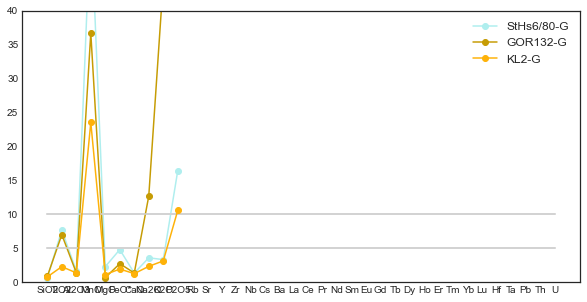

(218, 39)
270918


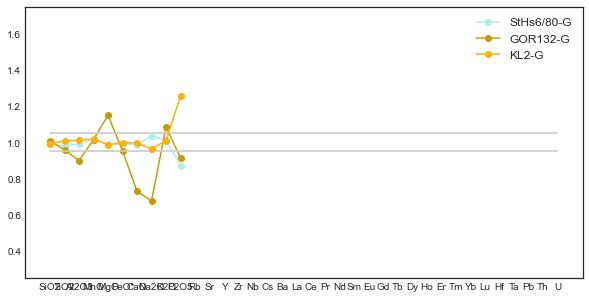

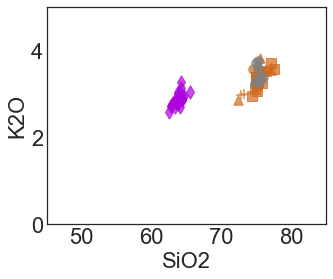

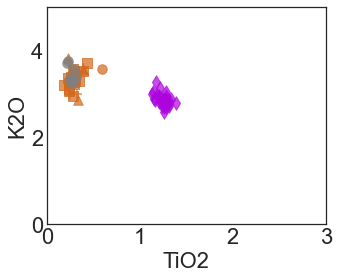

290918


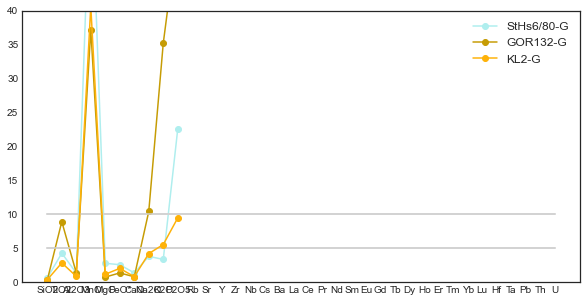

(218, 39)
290918


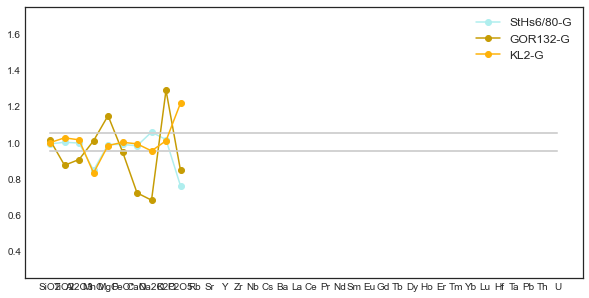

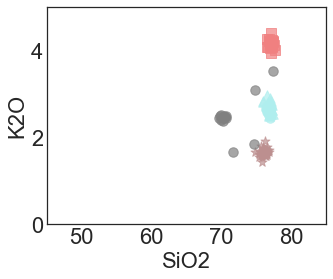

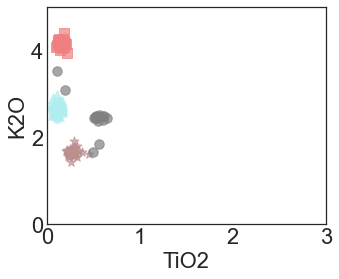

28-11-2009


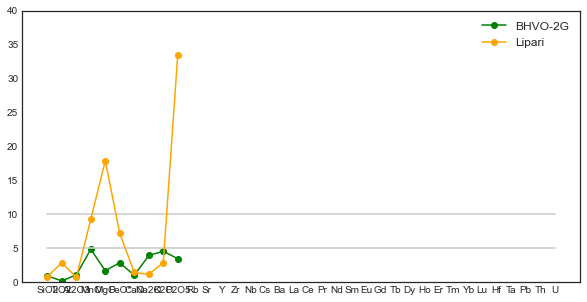

(218, 39)


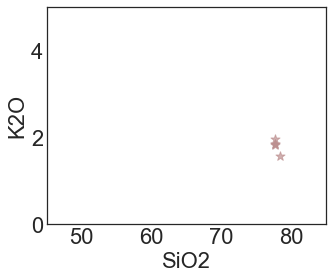

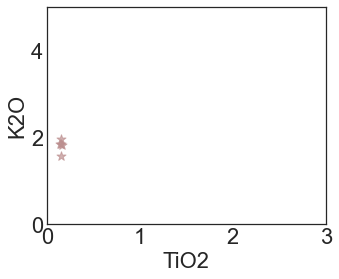

21-10-2010


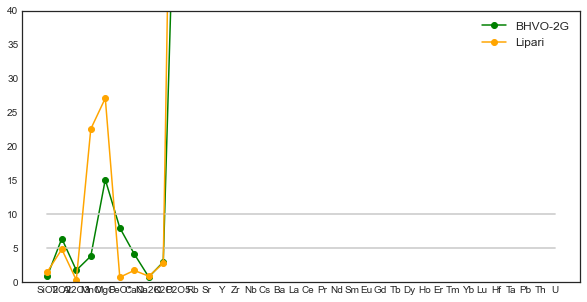

(218, 39)


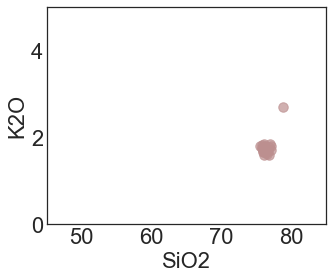

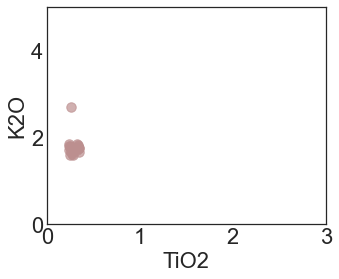

In [28]:
for run in Data_standards.MeasurementRun.unique():
    Data_standards_temp = Data_standards[Data_standards.MeasurementRun == run]
    Standards_Color_temp = Standards_Color[Standards_Color.MeasurementRun == run]
    Data_temp = Data[Data.MeasurementRun == run]
    
    graficar_RSD(Data_standards_temp)
    graficar_Acc(Standards_Color_temp)
    graficar_versus_core('SiO2','K2O',Data_temp, Xmin=45,Xmax=85,Ymin=0,Ymax=5)
    graficar_versus_core('TiO2','K2O',Data_temp,Xmin=0,Xmax=3,Ymin=0,Ymax=5)
